<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import" data-toc-modified-id="Import-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import</a></span><ul class="toc-item"><li><span><a href="#Packages" data-toc-modified-id="Packages-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Packages</a></span></li><li><span><a href="#Fonctions" data-toc-modified-id="Fonctions-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Fonctions</a></span></li><li><span><a href="#Données" data-toc-modified-id="Données-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Données</a></span></li></ul></li><li><span><a href="#Exploration-des-données" data-toc-modified-id="Exploration-des-données-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Exploration des données</a></span></li><li><span><a href="#Exploration-des-données-filtrées" data-toc-modified-id="Exploration-des-données-filtrées-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Exploration des données filtrées</a></span></li><li><span><a href="#Test-Fonctions" data-toc-modified-id="Test-Fonctions-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Test Fonctions</a></span></li><li><span><a href="#Pipeline" data-toc-modified-id="Pipeline-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Pipeline</a></span></li><li><span><a href="#Iterative-Imputer" data-toc-modified-id="Iterative-Imputer-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Iterative Imputer</a></span></li><li><span><a href="#Graphiques" data-toc-modified-id="Graphiques-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Graphiques</a></span></li><li><span><a href="#ACP" data-toc-modified-id="ACP-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>ACP</a></span></li><li><span><a href="#Clustering" data-toc-modified-id="Clustering-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Clustering</a></span></li><li><span><a href="#ANOVA" data-toc-modified-id="ANOVA-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>ANOVA</a></span></li><li><span><a href="#Test-Statistique" data-toc-modified-id="Test-Statistique-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Test Statistique</a></span></li></ul></div>

# Import
## Packages

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.stats import f_oneway
from math import pi
import scipy.stats as stats
import warnings

# On ignore les avertissements qui bloquent les graphiques
warnings.filterwarnings('ignore')

## Fonctions

In [3]:
class MissingColumnsError(Exception):
    """
    Exception qui affiche les colonnes manquantes lors de la vérification.
    
    Args:
        message (str): Description de l'erreur
        missing_columns (list): Liste des colonnes manquantes à afficher dans le message
    """

    def __init__(self, message, missing_columns):
        self.message = f"Il manque une ou plusieurs colonnes : {missing_columns}"
        super().__init__(self.message)


def separate_list(list_to_separate: list, lenght_list: int) -> list:
    """
    Args:
        list_to_separate (list): Liste à diviser en plusieurs sous-liste
        lenght_list (int): Taille des sous-listes à générer
        
    Returns:
        La liste des sous-listes générées
    """

    return [
        list_to_separate[i:i + lenght_list]
        for i in range(0, len(list_to_separate), lenght_list)
    ]


def check_columns_presence(df, columns_to_test):
    """
    Fonction qui vérifie la présence des colonnes dans le DataFrame
    Si les colonnes sont présentes, retourne un booléen, affiche l'erreur avec les colonnes manquantes
    
    Args: 
        df: DataFrame dans lequel faire la vérification
        columns_to_test: liste des colonnes à vérifier
        
    Return:
        True si toutes les colonnes sont présentes, sinon soulève l'exception
        
    Raises:
        MissingColumnsError: Si au moins une colonnes est manquante
    """

    columns_df = df.columns
    columns_missing = []

    for col in columns_to_test:
        if col not in columns_df:
            columns_missing.append(col)

    if len(columns_missing) > 0:
        raise MissingColumnsError("", columns_missing)
    else:
        return True


def drop_columns(df, columns_to_drop):
    """
    Fonction qui enlève les colonnes demandées
    
    Args:
        df: DataFrame auquel enlevé les colonnes
        columns_to_drop: colonnes à enlever
        
    Returns:
        Dataframe sans les colonnes à enlever
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """

    try:
        check_columns_presence(df, columns_to_drop)

        df.drop(columns=columns_to_drop, inplace=True)

        return df

    except MissingColumnsError as e:
        print(f"Il y a une erreur : {e}")


# Fonction qui enlève les valeurs abérantes pour les colonnes des numériques
def drop_outliers_nutriments(df):
    """
    Fonction qui enlève les lignes avec des données abérrantes des colonnes exprimées pour 100g:
    en-dessous de 0 et au-dessus de 100 pour les nutriments, en-dessous de 0 et au-dessus de 4000 pour l'énergie
    
    Args:
        df: DataFrame contenant les valeurs à effacer
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """

    colonnes_to_check = [
        "energy_100g", "saturated-fat_100g", "fat_100g", "sugars_100g",
        "salt_100g", "proteins_100g", "fiber_100g",
        "fruits-vegetables-nuts_100g"
    ]

    try:
        check_columns_presence(df, colonnes_to_check)

        lines_to_drop = df[((df["energy_100g"] < 0) |
                            (df["energy_100g"] >= 4000)) |
                           ((df["saturated-fat_100g"] < 0)
                            | (df["saturated-fat_100g"] > 100)) |
                           ((df["fat_100g"] < 0) | (df["fat_100g"] > 100)) |
                           ((df["sugars_100g"] < 0) |
                            (df["sugars_100g"] > 100))
                           | ((df["salt_100g"] < 0) | (df["salt_100g"] > 100))
                           | ((df["proteins_100g"] < 0) |
                              (df["proteins_100g"] > 100)) |
                           ((df["fiber_100g"] < 0) | (df["fiber_100g"] > 100))
                           | ((df["fruits-vegetables-nuts_100g"] < 0) |
                              (df["fruits-vegetables-nuts_100g"] > 100))]

        return df.drop(lines_to_drop.index)

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def drop_null_lines(df):
    """
    Fonction qui enlève les lignes vides pour tous les nutriments
    
    Args:
        df: DataFrame contenant les valeurs à effacer
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    
    columns_nutriments = [
        "saturated-fat_100g", "fat_100g", "sugars_100g", "salt_100g",
        "proteins_100g", "fiber_100g", "fruits-vegetables-nuts_100g"
    ]

    try:
        check_columns_presence(df, columns_nutriments)

        nutriments_data = df[columns_nutriments].copy()
        nutriments_data.dropna(how="all", inplace=True)

        return df.loc[nutriments_data.index]

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def drop_lines(a, b, c) -> bool:
    """
    Fonction qui retourne False si une des valeurs des variables alphabétique n'est pas un string
    
    Args:
        a: première variable à regarder
        b: deuxième variable à regarder
        c: troisième variable à regarder
        
    Return:
        boolean: True si les 3 sont des string, False sinon
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    if isinstance(a, str) & isinstance(b, str) & isinstance(c, str):
        return True
    else:
        return False


def drop_lines_superior_101(df):
    """
    Fonction qui supprime les lignes avec un total de nutriments supérieur à 101
    101 car quelques milligrammes peuvent dépasser de 100
    
    Args:
        df: DataFrame à vérifier
        
    Return:
        df : DataFrame nettoyé 
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    
    columns_sum_nutriments = [
        "fat_100g", "sugars_100g", "salt_100g", "proteins_100g", "fiber_100g",
        "fruits-vegetables-nuts_100g"
    ]

    try:
        check_columns_presence(df, columns_sum_nutriments)

        data_nutriments = df[columns_sum_nutriments]
        data_nutriments["somme_100g"] = data_nutriments.fillna(value=0).sum(
            axis=1)

        return df[data_nutriments["somme_100g"] < 101]

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def fill_lines_at_100(df):
    """
    Fonction qui remplit les lignes si le total des nutriments vaut deja 100 ou plus
    
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame remplit
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    
    columns_sum_nutriments = [
        "fat_100g", "sugars_100g", "salt_100g", "proteins_100g", "fiber_100g",
        "fruits-vegetables-nuts_100g"
    ]

    try:
        check_columns_presence(df, columns_sum_nutriments)

        data_nutriments = df[columns_sum_nutriments]
        data_nutriments["somme_100g"] = data_nutriments.fillna(value=0).sum(
            axis=1)
        df[data_nutriments["somme_100g"] >= 100].fillna(value=0, inplace=True)

        return df

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def fill_columns_fruits_additives(df):
    """
    Fonction qui remplit les olonnes de fruits-vegetables-nuts_100g et additives_n à 0
    
    Args:
        df: DataFrame à remplir
        
    Return:
        df: DataFrame remplit
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    
    df["fruits-vegetables-nuts_100g"].fillna(value=0, inplace=True)
    df["additives_n"].fillna(value=0, inplace=True)

    return df


def drop_lines_null_catageory(df):
    """
    Fonction qui supprime les lignes avec une des 3 colonnes alphabétiques nulle.
    
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
        
    columns_categories = ["product_name", "brands", "countries_fr"]

    try:
        check_columns_presence(df, columns_categories)

        return df.dropna(subset=columns_categories)

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def drop_dupes(df):
    """
    Fonction qui supprimes les duplicatas sur les colonnes product_name et brands
 
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    columns_dupes = ["product_name", "brands"]

    try:
        check_columns_presence(df, columns_dupes)

        df.drop_duplicates(subset=columns_dupes, keep="last", inplace=True)

        return df

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def drop_lines_non_string(df):
    """
    Fonction qui supprime les lignes avec une des 3 colonnes alphabétiques non string ou ecrite en alphabet non latin.
    
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    columns_categories = ["product_name", "brands", "countries_fr"]

    try:
        check_columns_presence(df, columns_categories)

        string_data = df.apply(lambda r: drop_lines(r["product_name"], r[
            "brands"], r["countries_fr"]),
                               axis=1)
        df = df[string_data]

        df.sort_values("product_name", inplace=True)
        df.reset_index(drop=True, inplace=True)

        last_name = df[df["product_name"].str.startswith("z")].index[-1]
        df.drop(df[last_name + 1:].index, inplace=True)

        return df

    except MissingcolumnsError as e:
        print(f"Il y a une erreur : {e}")


def scaling_and_imputation_nutriments(df):
    """
    Fonction qui scale les données avec de faire l'imputation des valeurs manquantes grâce au KNNImputer
    
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    # Colonnes à Scaler avant imputation
    imputation_columns = [
        "energy_100g", "saturated-fat_100g", "fat_100g", "sugars_100g",
        "salt_100g", "proteins_100g", "fiber_100g",
        "fruits-vegetables-nuts_100g"
    ]

    try:
        check_columns_presence(df, imputation_columns)

        robust_scaler = RobustScaler()
        knn_imputer = KNNImputer()

        imputation_data = df[imputation_columns]

        scaled_data = robust_scaler.fit_transform(imputation_data)

        imputed_data = knn_imputer.fit_transform(scaled_data)
        imputed_data = pd.DataFrame(
            robust_scaler.inverse_transform(imputed_data),
            columns=imputation_columns)
        
        df.reset_index(drop= True, inplace=True)

        df[imputation_columns] = imputed_data

        return df

    except MissingColumnsError as e:
        print(f"Il y a une erreur : {e}")


def energy_from_fat_imputation(df):
    """
    Fonction qui remplit la colonne energy-from-fat_100g gràace à cette formule :
    energy-from-fat = fat * 9
    
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame nettoyé
        
    Raises:
        MissingColumnsError: si une colonne est manquante
    """
    
    try:
        check_columns_presence(df, ["energy-from-fat_100g"])
        
        df["energy-from-fat_100g"] = df["fat_100g"] * 9
        
        return df
        
    except MissingColumnsError as e:
        print(f"Il y a une erreur : {e}")
        
#
def nutriscore_calculation(row):
    """
    Fonction qui calcule le nutriscore en fonction des nutriments
    
    Args:
        row: ligne de données avec les colonnes de nutriments
        
    Return:
        nutriscore: le score calculé
    """
    energy = row["energy_100g"]
    saturated_fat = row["saturated-fat_100g"]
    sugar = row["sugars_100g"]
    salt = row["salt_100g"]
    protein = row["proteins_100g"]
    fiber = row["fiber_100g"]
    fruits = row["fruits-vegetables-nuts_100g"]

    energy_thresholds = {
        335: 1,
        670: 2,
        1005: 3,
        1340: 4,
        1675: 5,
        2010: 6,
        2345: 7,
        2680: 8,
        3015: 9,
        3350: 10
    }

    saturated_fat_thresholds = {
        1: 1,
        2: 2,
        3: 3,
        4: 4,
        5: 5,
        6: 6,
        7: 7,
        8: 8,
        9: 9,
        10: 10
    }

    sugar_thresholds = {
        3.4: 1,
        6.8: 2,
        10: 3,
        14: 4,
        17: 5,
        20: 6,
        24: 7,
        27: 8,
        31: 9,
        34: 10,
        37: 11,
        41: 12,
        44: 13,
        48: 14,
        51: 15
    }

    salt_thresholds = {
        0.2: 1,
        0.4: 2,
        0.6: 3,
        0.8: 4,
        1: 5,
        1.2: 6,
        1.4: 7,
        1.6: 8,
        1.8: 9,
        2: 10,
        2.2: 11,
        2.4: 12,
        2.6: 13,
        2.8: 14,
        3: 15,
        3.2: 16,
        3.4: 17,
        3.6: 18,
        3.8: 19,
        4: 20
    }

    proteins_thresholds = {2.4: 1, 4.8: 2, 7.2: 3, 9.6: 4, 12: 5, 14: 6, 17: 7}

    fiber_thresholds = {3.0: 1, 4.1: 2, 5.2: 3, 6.3: 4, 7.4: 5}

    fruits_thresholds = {40: 1, 60: 2, 80: 5}

    p_energy = 0
    p_saturated_fat = 0
    p_sugar = 0
    p_salt = 0
    p_protein = 0
    p_fiber = 0
    p_fruits = 0

    list_thresholds = [
        energy_thresholds, saturated_fat_thresholds, sugar_thresholds,
        salt_thresholds, proteins_thresholds, fiber_thresholds,
        fruits_thresholds
    ]

    list_nutriments = [
        energy, saturated_fat, sugar, salt, protein, fiber, fruits
    ]

    list_points = [0] * 7
    
    for i in range(0, len(list_thresholds)):
        for threshold, value in sorted(list_thresholds[i].items(),
                                       reverse=True):
            if list_nutriments[i] > threshold:
                list_points[i] = value
                break

    negative_p = list_points[0] + list_points[1] + list_points[
        2] + list_points[3]

    if negative_p > 11:
        positive_p = list_points[5] + list_points[6]
    else:
        positive_p = list_points[4] + list_points[5] + list_points[6]

    nutriscore = negative_p - positive_p

    return nutriscore


def nutriscore_category(nutriscore):
    """
    Fonction qui retrouve la catégorie correspondante au nutriscore
    
    Args:
        nutriscore: valeur du nutriscore de la ligne
        
    Return:
        nutriscore_categ: la catégorie de nutriscore correspondante
    """
    nutriscore_thresholds = {-18: "A", 1: "B", 3: "C", 11: "D", 19: "E"}

    for threshold, value in sorted(nutriscore_thresholds.items(),
                                   reverse=True):
        if nutriscore >= threshold:
            nutriscore_categ = value
            break

    return nutriscore_categ


def nutrition_score_implantation(df):
    """
    Fonction qui implante le nutriscore et la catégorie dans le DataFrame
    
    Args:
        df: DataFrame à traiter
        
    Return:
        df: DataFrame remplit
    """
    df["nutrition-score-fr_100g"] = df.apply(lambda r: nutriscore_calculation(r), axis=1)
    
    df["nutrition_grade_fr"] = df.apply(lambda r: nutriscore_category(r["nutrition-score-fr_100g"]), axis=1)

    return df


def nb_produits_par_pays(countries:list, index):
    list_countries = {}
    country_names = str(countries).split(",")
    cleaned_country_names = [name.split(":")[-1] for name in country_names]
    count = len(cleaned_country_names)
    return count


def number_countries_implatation(df):
    try:
        check_columns_presence(df, ["countries_fr"])
        
        df["nb_pays"] = df.apply(
        lambda r: nb_produits_par_pays(r["countries_fr"], r.name), axis=1)
        
        return df
    
    except MissingColumnsError as e:
        print(f"Il y a une erreur : {e}")

def correlation_graph(pca, x_y, features):
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y
    x, y = x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante :
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,
                 0,
                 pca.components_[x, i],
                 pca.components_[y, i],
                 head_width=0.07,
                 head_length=0.07,
                 width=0.02,
                 length_includes_head=True)

        # Les labels
        plt.text(pca.components_[x, i] + 0.05, pca.components_[y, i] + 0.05,
                 features[i])

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(
        x + 1, round(100 * pca.explained_variance_ratio_[x], 1)))
    plt.ylabel('F{} ({}%)'.format(
        y + 1, round(100 * pca.explained_variance_ratio_[y], 1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x + 1, y + 1))

    # Le cercle
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)


def display_factorial_planes(X_projected,
                             x_y,
                             pca=None,
                             labels=None,
                             clusters=None,
                             alpha=1,
                             figsize=[10, 8],
                             marker="."):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize:
        figsize = (7, 6)

    # On gère les labels
    if labels is None:
        labels = []
    try:
        len(labels)
    except Exception as e:
        raise e

    # On vérifie la variable axis
    if not len(x_y) == 2:
        raise AttributeError("2 axes sont demandées")
    if max(x_y) >= X_.shape[1]:
        raise AttributeError("la variable axis n'est pas bonne")

    # on définit x et y
    x, y = x_y

    # Initialisation de la figure
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters

    # Les points
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha,
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, alpha=alpha)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe
    if pca:
        v1 = str(round(100 * pca.explained_variance_ratio_[x])) + " %"
        v2 = str(round(100 * pca.explained_variance_ratio_[y])) + " %"
    else:
        v1 = v2 = ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() * 1.1
    y_max = np.abs(X_[:, y]).max() * 1.1

    # On borne x et y
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom=-y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0, 0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels):
        # j'ai copié collé la fonction sans la lire
        for i, (_x, _y) in enumerate(X_[:, [x, y]]):
            plt.text(_x,
                     _y + 0.05,
                     labels[i],
                     fontsize='14',
                     ha='center',
                     va='center')

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()

## Données

In [4]:
# Import des données avec une précision des séparateurs
# précision de low_memory = False pour importer sans erreurs de dtype de colonnes
data = pd.read_csv("../Data/OpenFoodFacts.csv", sep="\t", low_memory=False)

project_columns = [
    "product_name", "brands", "countries_fr", "energy_100g",
    "energy-from-fat_100g", "saturated-fat_100g", "fat_100g", "sugars_100g",
    "salt_100g", "proteins_100g", "fiber_100g", "fruits-vegetables-nuts_100g",
    "additives_n", "nutrition-score-fr_100g", "nutrition_grade_fr"
]

# Exploration des données

In [5]:
# exemple de 5 lignes du DataFrame
data.sample(5)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
179435,20362041,http://world-fr.openfoodfacts.org/produit/2036...,openfoodfacts-contributors,1419851788,2014-12-29T11:16:28Z,1450897254,2015-12-23T19:00:54Z,Natives Olivenöl Extra,NaN,750 ml,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,21.0,NaN,NaN
210806,3256223680773,http://world-fr.openfoodfacts.org/produit/3256...,aleene,1443976556,2015-10-04T16:35:56Z,1443977493,2015-10-04T16:51:33Z,Chips saveur curry mangue,Chips de pommes de terre saveur curry mangue,135 g,...,NaN,NaN,NaN,NaN,NaN,NaN,10.0,10.0,NaN,NaN
145825,0786560557092,http://world-fr.openfoodfacts.org/produit/0786...,usda-ndb-import,1489093569,2017-03-09T21:06:09Z,1489093569,2017-03-09T21:06:09Z,Big 100 Meal Replacement Bar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9.0,9.0,NaN,NaN
150588,0813305013961,http://world-fr.openfoodfacts.org/produit/0813...,usda-ndb-import,1489079911,2017-03-09T17:18:31Z,1489079911,2017-03-09T17:18:31Z,Multi-Grain Bread,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
292996,7613035723993,http://world-fr.openfoodfacts.org/produit/7613...,kiliweb,1488060237,2017-02-25T22:03:57Z,1488060237,2017-02-25T22:03:57Z,"Les Recettes De L'atelier - Raisins, Amandes &...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN


In [6]:
# Dimensions des données
data.shape

(320772, 162)

In [7]:
#Création d'une liste avec toutes les colonnes
colonnes = list(data.columns)

# Séparation de la liste en plusieurs sous-liste de 21
sous_colonnes = separate_list(colonnes, 21)

# Affichage des types des colonnes
print("Dtypes des Colonnes :\n")
for liste in sous_colonnes:
    print(data[liste].dtypes, "\n")

Dtypes des Colonnes :

code                         object
url                          object
creator                      object
created_t                    object
created_datetime             object
last_modified_t              object
last_modified_datetime       object
product_name                 object
generic_name                 object
quantity                     object
packaging                    object
packaging_tags               object
brands                       object
brands_tags                  object
categories                   object
categories_tags              object
categories_fr                object
origins                      object
origins_tags                 object
manufacturing_places         object
manufacturing_places_tags    object
dtype: object 

labels                       object
labels_tags                  object
labels_fr                    object
emb_codes                    object
emb_codes_tags               object
first_packaging_code_geo 

In [8]:
# Nombre de lignes dupliquées
data.duplicated().sum()

0

In [9]:
# Nombre de lignes avec les product_name, brands et countries_fr dupliquées
duplicated_data = data[["product_name", "brands", "countries_fr"]].duplicated()
duplicated_data.sum()

35787

In [10]:
# visuel de quelques unes des lignes dupliquées
data[duplicated_data].sort_values("product_name")

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
33951,0036800499416,http://world-fr.openfoodfacts.org/produit/0036...,usda-ndb-import,1489052503,2017-03-09T09:41:43Z,1489052504,2017-03-09T09:41:44Z,#Error!,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33952,0036800499423,http://world-fr.openfoodfacts.org/produit/0036...,usda-ndb-import,1489052504,2017-03-09T09:41:44Z,1489052504,2017-03-09T09:41:44Z,#Error!,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
114524,0300258900122,http://world-fr.openfoodfacts.org/produit/0300...,usda-ndb-import,1489065030,2017-03-09T13:10:30Z,1489065030,2017-03-09T13:10:30Z,"0 Calorie Sweetener, Original",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
119671,0631656560541,http://world-fr.openfoodfacts.org/produit/0631...,usda-ndb-import,1489095862,2017-03-09T21:44:22Z,1489095862,2017-03-09T21:44:22Z,1 Clean Protein Bar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN
8577,0011213410104,http://world-fr.openfoodfacts.org/produit/0011...,usda-ndb-import,1489063451,2017-03-09T12:44:11Z,1489063451,2017-03-09T12:44:11Z,1 Dozen Farm Fresh Eggs,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320747,9800895250,http://world-fr.openfoodfacts.org/produit/9800...,tacite-mass-editor,1490554697,2017-03-26T18:58:17Z,1490554697,2017-03-26T18:58:17Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320748,9802735,http://world-fr.openfoodfacts.org/produit/9802735,date-limite-app,1472728165,2016-09-01T11:09:25Z,1472728167,2016-09-01T11:09:27Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320752,98709870987,http://world-fr.openfoodfacts.org/produit/9870...,openfoodfacts-contributors,1472254210,2016-08-26T23:30:10Z,1474729393,2016-09-24T15:03:13Z,NaN,NaN,33cl,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320755,988639,http://world-fr.openfoodfacts.org/produit/988639,tacite-mass-editor,1490554698,2017-03-26T18:58:18Z,1490554698,2017-03-26T18:58:18Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Calcul de la moyenne de données manquantes dans tout le DataFrame
data.isnull().mean().mean() * 100

76.22157263195135

In [12]:
# Calcul des données manquantes
data_nulle = ((data.isnull().sum() / data.shape[0]) *
              100).sort_values(ascending=False).reset_index()

# Changement de noms des colonnes
data_nulle.columns = ["Variables", "Taux_de_Nulle"]

# Liste des colonnes totallement vides
coll_null = data_nulle[data_nulle["Taux_de_Nulle"] == 100]

# Suppression des colonnes vides
data_coll = data_nulle[~(data_nulle["Taux_de_Nulle"] == 100)]

# Affichage des colonnes vides
coll_null

,Variables,Taux_de_Nulle
0,water-hardness_100g,100.0
1,no_nutriments,100.0
2,ingredients_that_may_be_from_palm_oil,100.0
3,nutrition_grade_uk,100.0
4,nervonic-acid_100g,100.0
5,erucic-acid_100g,100.0
6,mead-acid_100g,100.0
7,elaidic-acid_100g,100.0
8,butyric-acid_100g,100.0
9,caproic-acid_100g,100.0


In [13]:
# Quelque une des colonnes et leur taux de données
data_coll

,Variables,Taux_de_Nulle
16,myristic-acid_100g,99.999688
17,palmitic-acid_100g,99.999688
18,caprylic-acid_100g,99.999688
19,stearic-acid_100g,99.999688
20,montanic-acid_100g,99.999688
...,...,...
157,created_datetime,0.002806
158,created_t,0.000935
159,creator,0.000623
160,last_modified_datetime,0.000000


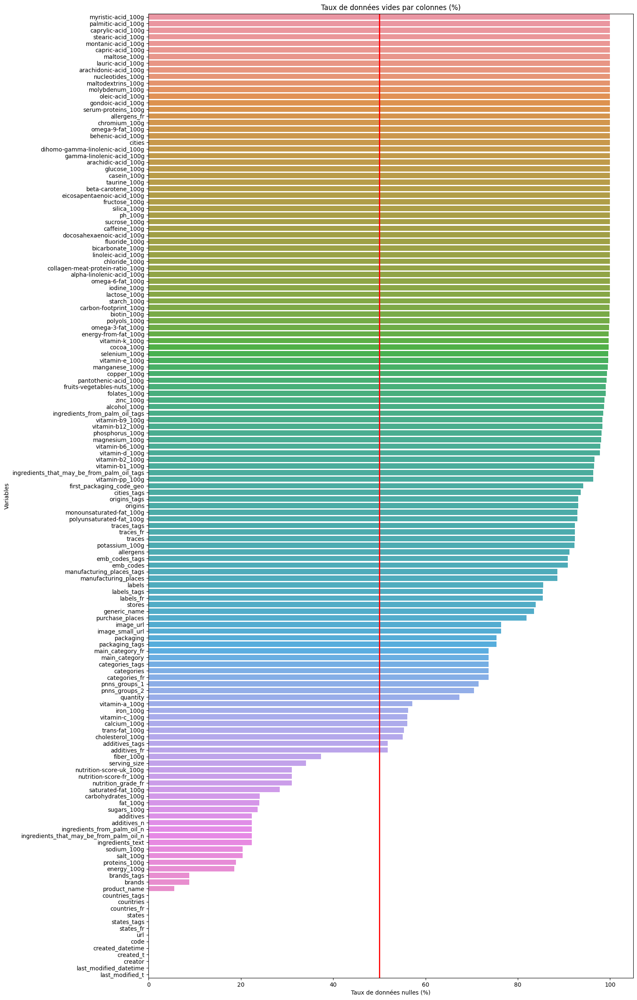

In [14]:
# Graphique qui présente le taux de données nulles par colonnes
plt.figure(figsize=(15, 30))
sns.barplot(x="Taux_de_Nulle", y="Variables", data=data_coll)

# Ajout d'une ligne qui représente les 50 pourcents de données nulles
plt.axvline(x=50, linewidth=2, color="r")

#Ajout du titre et du label de l'axe x
plt.title("Taux de données vides par colonnes (%)")
plt.xlabel("Taux de données nulles (%)")
plt.show()

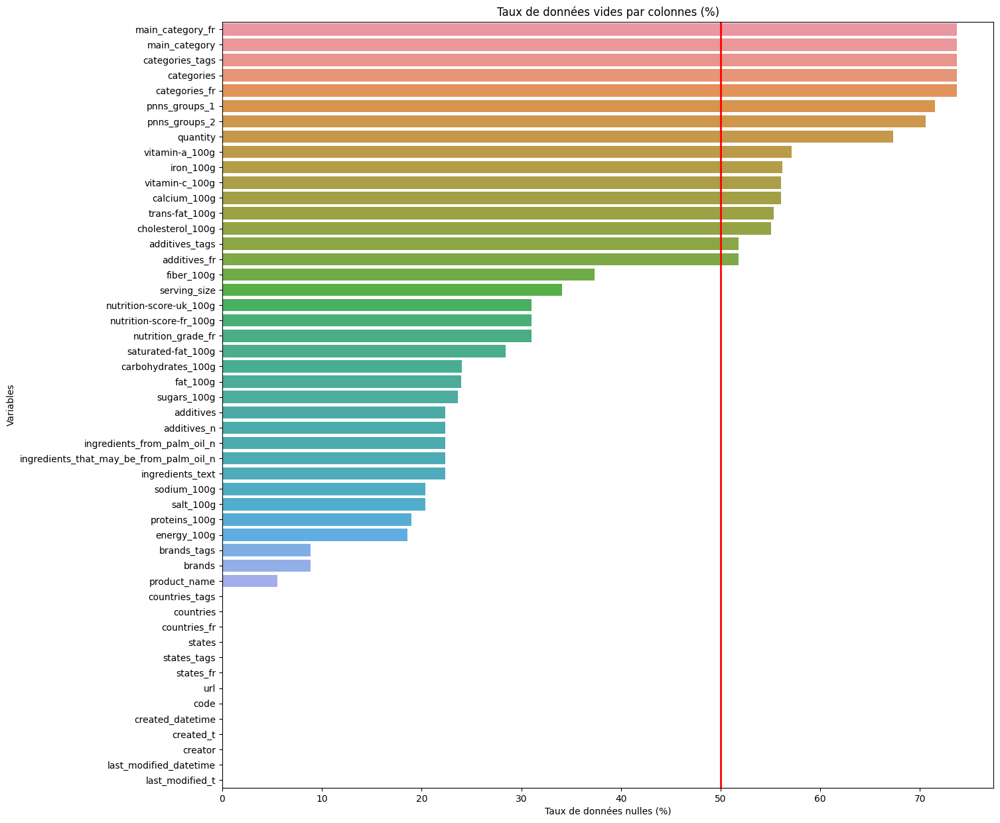

In [15]:
# Graphiques de données vides à moins de 75%
plt.figure(figsize=(15, 15))
sns.barplot(x="Taux_de_Nulle", y="Variables", data=data_coll[data_coll["Taux_de_Nulle"] < 75])
plt.axvline(x=50, linewidth=2, color="r")
plt.title("Taux de données vides par colonnes (%)")
plt.xlabel("Taux de données nulles (%)")
plt.show()

In [16]:
# données vides entre 50 et 75%
coll_vide_50 = data_coll[data_coll["Taux_de_Nulle"] > 50]
coll_vide_50[coll_vide_50["Taux_de_Nulle"] < 75]

,Variables,Taux_de_Nulle
112,main_category_fr,73.699076
113,main_category,73.699076
114,categories_tags,73.691906
115,categories,73.685359
116,categories_fr,73.685047
117,pnns_groups_1,71.471014
118,pnns_groups_2,70.542628
119,quantity,67.322896
120,vitamin-a_100g,57.117828
121,iron_100g,56.211265


In [17]:
# quelques exemples du nutriscore
data["nutrition_grade_fr"].sample(10)

89389       a
221226      e
182554    NaN
207194    NaN
287602      e
133163      a
46859     NaN
96076     NaN
294041      d
115384      d
Name: nutrition_grade_fr, dtype: object

In [18]:
# Voir des exemple de catégories
data.loc[~(data["categories_fr"].isnull()),
         ["product_name", "categories_fr"]].sample(10)

,product_name,categories_fr
194091,Foie gras de canard entier du Sud-Ouest cuit a...,"Poissons et viandes et oeufs,Foies gras,Foies ..."
223418,Houmous extra,"Aliments et boissons à base de végétaux,Alimen..."
187785,Emincés de porc grillé et ses penne,"Plats préparés,Plats à base de viande,Plats à ..."
227507,Café 100% arabica soluble en stick,"Boissons,Boissons chaudes,Cafés,Boissons non s..."
210363,Sans sucre ajoutés,"Aliments et boissons à base de végétaux,Alimen..."
231844,Mes Pains à Dorer 2 Camusettes Campagne,"Aliments et boissons à base de végétaux,Alimen..."
264780,Scheiben Kräuter,"Aliments et boissons à base de végétaux,Alimen..."
209174,Jus Multifruits,"Aliments et boissons à base de végétaux,Boisso..."
190646,Pomme Banane,"Aliments pour bébé,Goûters et desserts pour bé..."
237832,Jus d'orange,"Aliments et boissons à base de végétaux,Boisso..."


# Exploration des données filtrées

In [19]:
# Récupération des colonnes interressantes pour notre projet
asked_data = data[project_columns].copy()

In [20]:
# Dimension des données
asked_data.shape

(320772, 15)

In [21]:
# Nombre de lignes dulpiquées
asked_data.duplicated().sum()

21054

In [22]:
asked_data.head()

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
0,Farine de blé noir,Ferme t'y R'nao,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Banana Chips Sweetened (Whole),NaN,États-Unis,2243.0,NaN,28.57,28.57,14.29,0.00000,3.57,3.6,NaN,0.0,14.0,d
2,Peanuts,Torn & Glasser,États-Unis,1941.0,NaN,0.00,17.86,17.86,0.63500,17.86,7.1,NaN,0.0,0.0,b
3,Organic Salted Nut Mix,Grizzlies,États-Unis,2540.0,NaN,5.36,57.14,3.57,1.22428,17.86,7.1,NaN,0.0,12.0,d
4,Organic Polenta,Bob's Red Mill,États-Unis,1552.0,NaN,NaN,1.43,NaN,NaN,8.57,5.7,NaN,0.0,NaN,NaN


In [23]:
# visuel des duplicatas
duplicated_data = asked_data[asked_data.duplicated()].sort_values("product_name")
duplicated_data.head()

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
119671,1 Clean Protein Bar,"Mission, Muscletech",États-Unis,1393.0,NaN,4.17,11.67,1.67,0.76200,35.00,28.3,NaN,0.0,6.0,c
49052,"1% Low Fat Chocolate Milk, Chocolate","Weis Quality, Weis Markets Inc.",États-Unis,259.0,NaN,0.62,1.04,10.00,0.19050,3.33,0.0,NaN,1.0,0.0,b
49051,"1% Low Fat Chocolate Milk, Chocolate","Weis Quality, Weis Markets Inc.",États-Unis,259.0,NaN,0.62,1.04,10.00,0.19050,3.33,0.0,NaN,1.0,0.0,b
75099,1% Low Fat Milk,All Star,États-Unis,176.0,NaN,0.62,1.04,5.00,0.11684,3.33,0.0,NaN,0.0,-1.0,a
73342,1% Low Fat Milk,Clover Organic Farms,États-Unis,209.0,NaN,0.62,1.04,5.83,0.17018,4.58,0.0,NaN,0.0,-1.0,a


In [24]:
# Description des valeurs numériques
asked_data.describe()

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g
count,2.611130e+05,857.000000,229554.000000,243891.000000,244971.000000,255510.000000,259922.000000,200886.000000,3036.000000,248939.000000,221210.000000
mean,1.141915e+03,585.501214,5.129932,12.730379,16.003484,2.028624,7.075940,2.862111,31.458587,1.936024,9.165535
std,6.447154e+03,712.809943,8.014238,17.578747,22.327284,128.269454,8.409054,12.867578,31.967918,2.502019,9.055903
min,0.000000e+00,0.000000,0.000000,0.000000,-17.860000,0.000000,-800.000000,-6.700000,0.000000,0.000000,-15.000000
25%,3.770000e+02,49.400000,0.000000,0.000000,1.300000,0.063500,0.700000,0.000000,0.000000,0.000000,1.000000
50%,1.100000e+03,300.000000,1.790000,5.000000,5.710000,0.581660,4.760000,1.500000,23.000000,1.000000,10.000000
75%,1.674000e+03,898.000000,7.140000,20.000000,24.000000,1.374140,10.000000,3.600000,51.000000,3.000000,16.000000
max,3.251373e+06,3830.000000,550.000000,714.290000,3520.000000,64312.800000,430.000000,5380.000000,100.000000,31.000000,40.000000


In [25]:
# pourcentage de données vides dans le dataframe
asked_data.isna().mean().mean() * 100

31.270788389676568

In [26]:
# Taux de données nulles par variables
data_null = ((asked_data.isnull().sum() / asked_data.shape[0]) *
             100).sort_values(ascending=False).reset_index()
data_null.columns = ["Variables", "Taux_de_Nulle"]
data_null

,Variables,Taux_de_Nulle
0,energy-from-fat_100g,99.732832
1,fruits-vegetables-nuts_100g,99.053533
2,fiber_100g,37.374210
3,nutrition-score-fr_100g,31.038245
4,nutrition_grade_fr,31.038245
5,saturated-fat_100g,28.437021
6,fat_100g,23.967491
7,sugars_100g,23.630803
8,additives_n,22.393787
9,salt_100g,20.345292


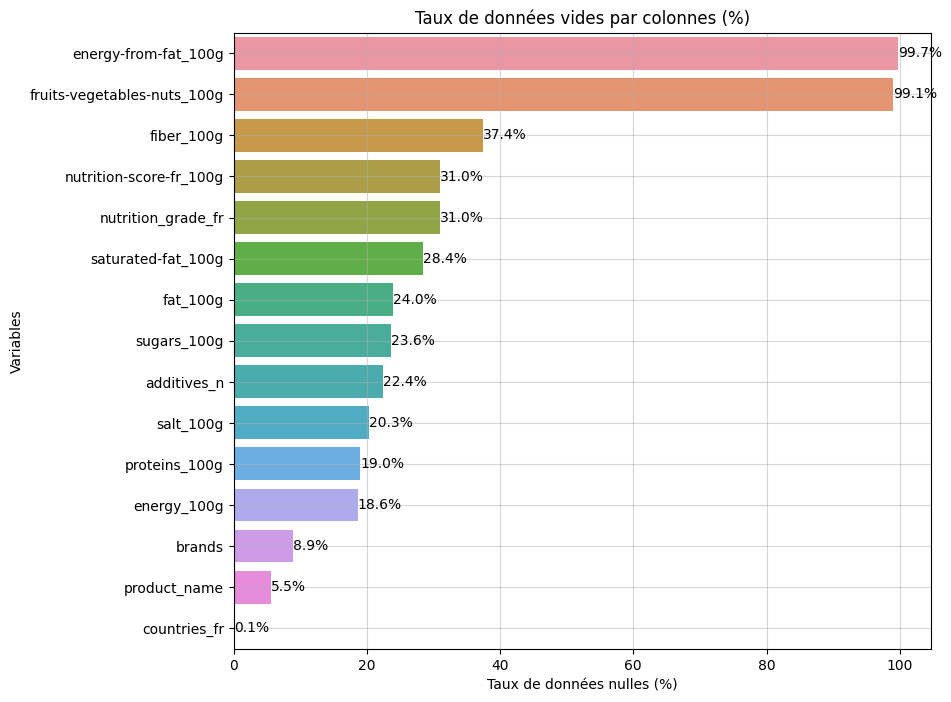

In [27]:
# Graphique du taux de nulle
plt.figure(figsize=(9, 8))
sns.barplot(x="Taux_de_Nulle", y="Variables", data=data_null)
plt.title("Taux de données vides par colonnes (%)")
plt.xlabel("Taux de données nulles (%)")
plt.grid(alpha=0.5)
for i, row in data_null.iterrows():
    plt.text(row["Taux_de_Nulle"],
             i,
             f"{row['Taux_de_Nulle']:.1f}%",
             va="center")
plt.show()

In [28]:
# nombre de duplicata sur les noms de produits et marques
asked_data[["product_name", "brands"]].duplicated(keep="last").sum()

37140

In [29]:
# Vérification des duplicatas
dupe = asked_data[asked_data[["product_name",
                              "brands"]].duplicated(keep=False)].sort_values(
                                  ["product_name", "brands"])
asked_data.drop_duplicates(subset=["product_name", "brands"],
                           keep="last",
                
                           inplace=True)
asked_data.reset_index(drop=True, inplace=True)
dupe.head(10)

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
294518,,NaN,Suisse,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
315118,,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33145,#Error!,Food Club,États-Unis,1904.0,NaN,NaN,0.00,NaN,0.0000,0.0,NaN,NaN,7.0,NaN,NaN
33951,#Error!,Food Club,États-Unis,1611.0,NaN,NaN,0.00,NaN,0.0000,0.0,NaN,NaN,10.0,NaN,NaN
33952,#Error!,Food Club,États-Unis,1046.0,NaN,NaN,0.00,NaN,2.5400,0.0,NaN,NaN,6.0,NaN,NaN
114520,"0 Calorie Sweetener, Original",Equal,États-Unis,0.0,NaN,NaN,0.00,100.00,0.0000,0.0,NaN,NaN,2.0,NaN,NaN
114524,"0 Calorie Sweetener, Original",Equal,États-Unis,0.0,NaN,NaN,0.00,100.00,0.0000,NaN,NaN,NaN,2.0,NaN,NaN
119670,1 Clean Protein Bar,"Mission, Muscletech",États-Unis,1393.0,NaN,4.17,11.67,1.67,0.7620,35.0,28.3,NaN,0.0,6.0,c
119671,1 Clean Protein Bar,"Mission, Muscletech",États-Unis,1393.0,NaN,4.17,11.67,1.67,0.7620,35.0,28.3,NaN,0.0,6.0,c
7554,1 Dozen Farm Fresh Eggs,Spartan,États-Unis,586.0,NaN,3.00,10.00,NaN,0.3556,12.0,NaN,NaN,0.0,NaN,NaN


In [30]:
#Création des varaibles de colonnes pour le traitement de données plus tard
# Liste avec toutes les colonnes du DataFrame
all_columns = list(data.columns)
# Les colonnes dont on ne se sert pas
columns_to_drop = [col for col in all_columns if col not in project_columns]

# Les colonnes avec le suffixe _100g
columns_100g = [col for col in project_columns if "100g" in col]
# Celles sans le suffixe
other_columns = [col for col in project_columns if "100g" not in col]

# Les colonnes numériques
numeric_columns = asked_data.select_dtypes(include="float64").columns
# Les colonnes de nutriments et d'énergie
nutriments_with_energy_columns = columns_100g[:-1]
# Uniquement les colonnes de nutriments
nutriments_columns = columns_100g[2:-1]
# Colonnes de nutriments qui servent à faire la somme
sum_nutriments_columns = nutriments_columns[1:]
# Les colonnes des catégories
categories_columns = ["product_name", "brands", "countries_fr"]

In [31]:
# Supression des lignes avec toutes les colonnes de nutriments vides
nutriments_data = asked_data[nutriments_columns].copy()
nutriments_data.dropna(how="all", inplace=True)

asked_data = asked_data.loc[nutriments_data.index]
asked_data.shape

(240637, 15)

In [32]:
numeric_columns

Index(['energy_100g', 'energy-from-fat_100g', 'saturated-fat_100g', 'fat_100g',
       'sugars_100g', 'salt_100g', 'proteins_100g', 'fiber_100g',
       'fruits-vegetables-nuts_100g', 'additives_n',
       'nutrition-score-fr_100g'],
      dtype='object')

In [33]:
nutriments_with_energy_columns

['energy_100g',
 'energy-from-fat_100g',
 'saturated-fat_100g',
 'fat_100g',
 'sugars_100g',
 'salt_100g',
 'proteins_100g',
 'fiber_100g',
 'fruits-vegetables-nuts_100g']

In [34]:
nutriments_columns

['saturated-fat_100g',
 'fat_100g',
 'sugars_100g',
 'salt_100g',
 'proteins_100g',
 'fiber_100g',
 'fruits-vegetables-nuts_100g']

In [35]:
sum_nutriments_columns

['fat_100g',
 'sugars_100g',
 'salt_100g',
 'proteins_100g',
 'fiber_100g',
 'fruits-vegetables-nuts_100g']

In [36]:
columns_to_drop

['code',
 'url',
 'creator',
 'created_t',
 'created_datetime',
 'last_modified_t',
 'last_modified_datetime',
 'generic_name',
 'quantity',
 'packaging',
 'packaging_tags',
 'brands_tags',
 'categories',
 'categories_tags',
 'categories_fr',
 'origins',
 'origins_tags',
 'manufacturing_places',
 'manufacturing_places_tags',
 'labels',
 'labels_tags',
 'labels_fr',
 'emb_codes',
 'emb_codes_tags',
 'first_packaging_code_geo',
 'cities',
 'cities_tags',
 'purchase_places',
 'stores',
 'countries',
 'countries_tags',
 'ingredients_text',
 'allergens',
 'allergens_fr',
 'traces',
 'traces_tags',
 'traces_fr',
 'serving_size',
 'no_nutriments',
 'additives',
 'additives_tags',
 'additives_fr',
 'ingredients_from_palm_oil_n',
 'ingredients_from_palm_oil',
 'ingredients_from_palm_oil_tags',
 'ingredients_that_may_be_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil',
 'ingredients_that_may_be_from_palm_oil_tags',
 'nutrition_grade_uk',
 'pnns_groups_1',
 'pnns_groups_2',
 'states',
 

In [37]:
# Nouvelles dimensions
asked_data.shape

(240637, 15)

In [38]:
# Nouvelle description
asked_data.describe()

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g
count,2.391440e+05,781.000000,211320.000000,222801.000000,225056.000000,234486.000000,238467.000000,184909.000000,2931.000000,215771.000000,203797.000000
mean,1.144102e+03,563.929680,5.131367,12.671546,15.888528,2.073658,7.116389,2.881967,31.409440,1.989716,9.157171
std,6.727784e+03,687.698053,8.058592,17.367849,22.302752,133.869796,8.408793,13.355646,31.973218,2.520438,9.058081
min,0.000000e+00,0.000000,0.000000,0.000000,-17.860000,0.000000,-800.000000,-6.700000,0.000000,0.000000,-15.000000
25%,3.850000e+02,57.600000,0.000000,0.000000,1.300000,0.063500,0.710000,0.000000,0.000000,0.000000,1.000000
50%,1.105000e+03,300.000000,1.790000,5.100000,5.600000,0.591820,4.850000,1.500000,23.000000,1.000000,10.000000
75%,1.674000e+03,882.000000,7.140000,20.000000,24.000000,1.384300,10.000000,3.600000,51.000000,3.000000,16.000000
max,3.251373e+06,3830.000000,550.000000,714.290000,3520.000000,64312.800000,430.000000,5380.000000,100.000000,31.000000,40.000000


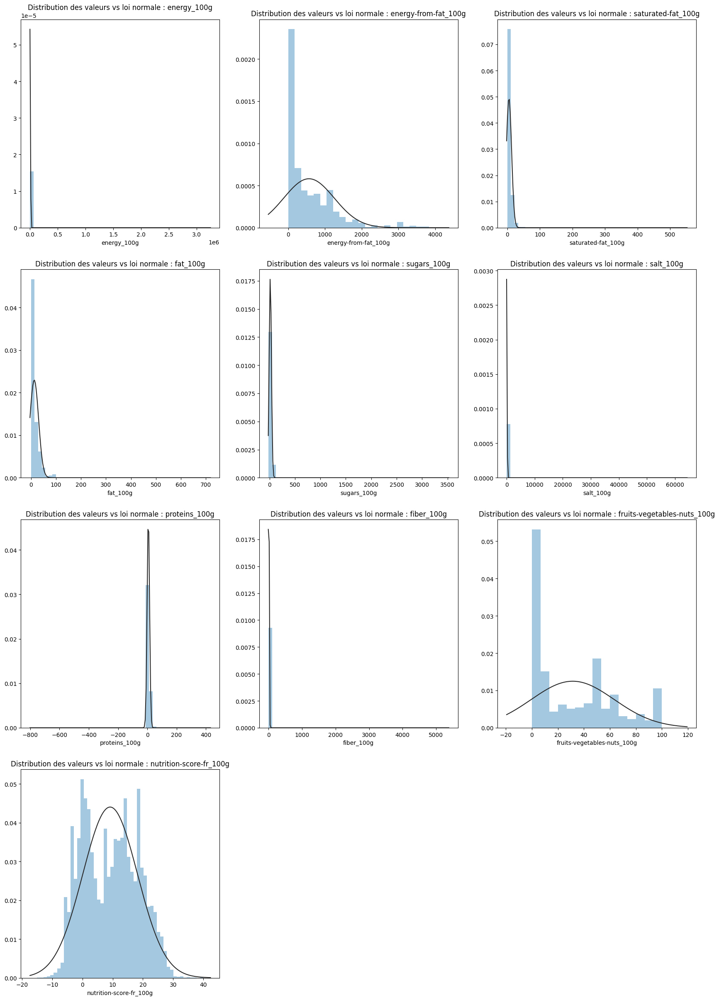

In [39]:
# Graphique sur la distribution des données pour chaque colonne
# Comparaison avec une coubre de loi normale pour vérifier
nb_graphs = len(columns_100g)

fig = plt.figure(figsize=(21, 30))

for i in range(len(columns_100g)):
    col = columns_100g[i]
    df = asked_data[col].dropna()

    fig.add_subplot(4, 3, i + 1)
    ax = sns.distplot(df, fit=stats.norm, kde=False)
    ax.set_title(f"Distribution des valeurs vs loi normale : {col}")
plt.show()

In [40]:
# Supression des valeurs vides pour les données de catégories
data_name = asked_data[categories_columns].copy()
data_name.dropna(inplace=True)

asked_data = asked_data.loc[data_name.index]

In [41]:
# Vérification des noms de produits
asked_data.sort_values("product_name", inplace=True)
asked_data.tail(20)

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
270014,寿司米,日本口,France,1504.0,NaN,0.10,0.4,0.20,0.013005,6.70,1.0,NaN,0.0,-1.0,a
281926,巧克力夹心饼干,OREO,Chine,2035.0,NaN,NaN,22.5,NaN,1.066800,4.80,NaN,NaN,NaN,NaN,NaN
240561,昆布,燈豐食品,Taiwan,418.0,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN
41533,本つゆ,Kikkoman Sales Usa Inc.,"Canada,États-Unis",347.0,NaN,NaN,0.0,13.33,9.822180,3.33,NaN,NaN,NaN,NaN,NaN
88396,李錦記蒜蓉,"李錦記, Lee Kum Kee","États-Unis,en:香港",126.0,NaN,0.40,2.3,1.10,0.350520,0.40,0.0,NaN,0.0,1.0,b
240389,東方美人茶,原萃,Taiwan,0.0,NaN,0.00,0.0,0.00,0.030700,0.00,0.0,NaN,0.0,0.0,b
240960,海鮮風味拉麵,"關谷,ITOMAN",Taiwan,1974.0,NaN,9.90,21.9,55.60,0.530860,10.90,NaN,NaN,NaN,26.0,e
253837,涉素牛肉,ZHEN XIANG,France,1784.0,NaN,0.00,11.4,2.50,3.947160,18.40,NaN,NaN,2.0,15.0,d
283447,特浓鲜奶薄饼,特浓鲜奶薄饼,Chine,1837.0,NaN,1.60,11.0,NaN,0.096520,15.00,NaN,NaN,NaN,NaN,NaN
240428,百吉檸檬棒棒冰,"百吉,POKI",Taiwan,392.0,NaN,0.00,0.0,22.80,0.000000,0.00,NaN,NaN,0.0,6.0,c


In [42]:
# Vérification des noms des marques 
asked_data.sort_values("brands").tail()

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
240959,わかめ醤油らぁめん,麺喰い亭,Japon,340.0,NaN,NaN,15.5,NaN,5.3340,7.4,NaN,NaN,0.0,NaN,NaN
280191,감자깡,"농심,Nongshim",Corée du Sud,1970.0,NaN,6.0,18.0,4.0,1.2700,6.0,NaN,NaN,0.0,15.0,d
280151,콩두유,빙그레,Corée du Sud,502.0,NaN,1.1,6.0,7.0,0.3810,6.0,NaN,NaN,NaN,1.0,b
280321,쌀떡,송학,France,983.0,NaN,0.0,0.5,2.0,0.1778,3.0,54.0,NaN,NaN,-4.0,a
280296,자연은 튼튼 (Jayeon-eun Teunteun),"자연은,Jayeon-eun",France,188.0,NaN,NaN,0.0,10.5,0.0127,0.0,NaN,NaN,4.0,NaN,NaN


In [43]:
# Vérification des noms des pays
asked_data.sort_values("countries_fr").tail(10)

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
18275,Ananas Scheiben gezuckert,Del Monte,"États-Unis,en:Deutschland",322.0,NaN,0.00,0.00,17.95,0.02286,0.00,0.8,NaN,NaN,-3.0,a
282908,Genuine Tasmanian Leatherwood Honey,the Tasmanian Honey Company,"États-Unis,en:Deutschland",1401.0,NaN,0.00,0.00,82.10,35.56000,0.00,0.0,NaN,0.0,24.0,e
159409,Christkindl Glühwein,Nürnberger-Wein-Kellerei,"États-Unis,en:Deutschland",365.5,NaN,0.10,0.10,8.60,0.10000,0.10,NaN,NaN,0.0,2.0,b
277756,Chocoladevlokken melk,"De Ruijter,Heinz, Koninklijke De Ruijter B.V.","États-Unis,en:Nederland",1889.0,NaN,9.30,15.00,70.00,0.12000,5.80,6.7,NaN,0.0,19.0,e
241336,オロナミンCドリンク (Oronamin C Drink),"オロナミン,en:Oronamin, Otsuka","États-Unis,en:Other-日本,en:日本",331.0,NaN,0.00,0.00,15.83,7.62000,0.00,0.0,NaN,0.0,30.0,e
11529,Guava drink,"Foco, Thai Agri Foods Co. Ltd.","États-Unis,en:Pays-bas",192.0,NaN,0.00,0.00,11.18,0.02794,0.00,0.0,NaN,1.0,15.0,e
280247,pepero,lotte,"États-Unis,en:Казахстан",1941.0,NaN,10.64,17.02,25.53,0.70866,8.51,4.3,NaN,NaN,18.0,d
280442,Oyster Sauce (ซอสหอยนางรม),"ตราแม่ครัวฉลากทอง,Maekrua Gold Label Brand, Tr...","États-Unis,en:ประเทศออสเตรเลีย,en:ประเทศไทย,en...",176.0,NaN,0.00,0.20,5.90,7.16280,0.30,NaN,NaN,1.0,11.0,d
88396,李錦記蒜蓉,"李錦記, Lee Kum Kee","États-Unis,en:香港",126.0,NaN,0.40,2.30,1.10,0.35052,0.40,0.0,NaN,0.0,1.0,b
149588,Ting,"PC Jamaica Ltd., Caribbean Flavor","États-Unis,Îles Vierges des États-Unis",209.0,NaN,NaN,0.00,12.00,0.00847,0.00,NaN,NaN,2.0,NaN,NaN


In [44]:
# suppression des lignes avec autre chose que des strings dans les colonnes de catégories
string_data = asked_data.apply(
    lambda r: drop_lines(r["product_name"], r["brands"], r["countries_fr"]),
    axis=1)
asked_data = asked_data[string_data]
asked_data.shape

(237115, 15)

In [45]:
# suppression des lignes avec des symboles type kenji
asked_data.reset_index(drop=True, inplace=True)
last_name = asked_data[asked_data["product_name"].str.startswith(
    "z")].index[-1]
asked_data.drop(asked_data[last_name + 1:].index, inplace=True)
asked_data.shape

(236102, 15)

In [46]:
asked_data[last_name:]

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
236101,zurück zum Ursprung Mühlviertler Bergbauern Fr...,zurück zum Ursprung,Autriche,1232.0,NaN,18.0,28.0,3.0,0.63,8.5,NaN,NaN,0.0,10.0,c


In [47]:
# Vérification du taux de remplissage
asked_data.isnull().mean()

product_name                   0.000000
brands                         0.000000
countries_fr                   0.000000
energy_100g                    0.005426
energy-from-fat_100g           0.996853
saturated-fat_100g             0.118627
fat_100g                       0.074900
sugars_100g                    0.061016
salt_100g                      0.021177
proteins_100g                  0.008789
fiber_100g                     0.227580
fruits-vegetables-nuts_100g    0.987641
additives_n                    0.097839
nutrition-score-fr_100g        0.149660
nutrition_grade_fr             0.149660
dtype: float64

Text(0.5, 1.0, 'Corrélation entre les variables de nutriments')

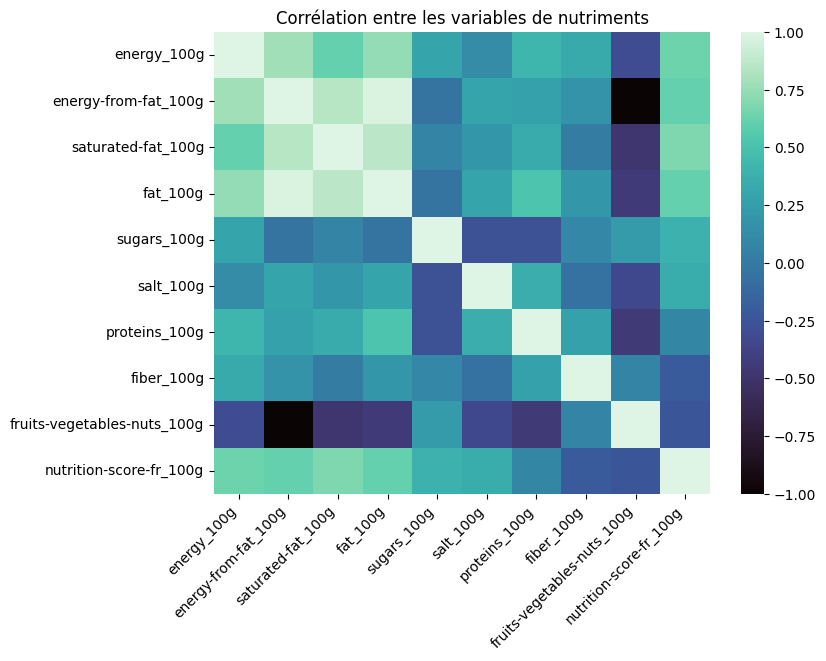

In [48]:
# Visuel des corrélations entre varaibles
correlated_data = asked_data[columns_100g].corr(method="spearman")

plt.figure(figsize= (8,6))
heatmap = sns.heatmap(correlated_data, cmap='mako')
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha="right")
plt.title("Corrélation entre les variables de nutriments")

In [49]:
# suppression des valeurs aberrantes
lines_to_drop = asked_data[
    (asked_data["energy_100g"] >= 4000) |
    ((asked_data["saturated-fat_100g"] < 0) |
     (asked_data["saturated-fat_100g"] > 100)) |
    ((asked_data["fat_100g"] < 0) | (asked_data["fat_100g"] > 100)) |
    ((asked_data["sugars_100g"] < 0) | (asked_data["sugars_100g"] > 100)) |
    ((asked_data["salt_100g"] < 0) | (asked_data["salt_100g"] > 100)) |
    ((asked_data["proteins_100g"] < 0) | (asked_data["proteins_100g"] > 100)) |
    ((asked_data["fiber_100g"] < 0) | (asked_data["fiber_100g"] > 100)) |
    ((asked_data["fruits-vegetables-nuts_100g"] < 0) |
     (asked_data["fruits-vegetables-nuts_100g"] > 100))]

asked_data.drop(lines_to_drop.index, inplace=True)

In [50]:
asked_data[nutriments_columns]

,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g
0,2.0,3.0,8.5,2.000000,13.0,NaN,NaN
1,0.0,0.0,9.7,0.030000,0.5,NaN,NaN
2,0.1,0.8,56.0,0.050038,0.8,4.8,NaN
3,6.2,14.3,34.3,0.530000,5.5,2.6,NaN
4,0.8,10.8,9.9,1.750000,5.1,0.4,NaN
...,...,...,...,...,...,...,...
236097,2.1,12.2,4.8,1.270000,11.8,0.1,NaN
236098,0.0,0.0,0.0,0.550000,0.0,1.1,NaN
236099,NaN,0.0,0.0,0.000000,0.0,NaN,NaN
236100,0.0,0.0,4.8,0.030000,0.3,0.5,NaN


In [51]:
# récupération des données dont au moins une des colonnes est à 100
data_nutriments_max = pd.DataFrame(columns=nutriments_with_energy_columns)
for col in data_nutriments_max.columns:
    df_nutriments = asked_data[asked_data[col] == asked_data[col].max()]
    data_nutriments_max = pd.concat([data_nutriments_max, df_nutriments],
                                    ignore_index=True)
data_nutriments_max.drop_duplicates(inplace=True)
data_nutriments_max.shape

(2152, 15)

In [52]:
data_nutriments_max[data_nutriments_max["saturated-fat_100g"] == 100]

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,product_name,brands,countries_fr,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
2,3661.0,NaN,100.0,100.00,0.0,0.0,0.0,0.0,NaN,Coconut Oil,Desi,États-Unis,0.0,20.0,e
3,418.0,NaN,100.0,NaN,100.0,2.0,100.0,100.0,NaN,Eau,Vital,France,NaN,24.0,e
4,3766.0,NaN,100.0,100.00,NaN,0.0,0.0,NaN,NaN,Ez Thun Dipping Aid,Wilton,États-Unis,1.0,NaN,NaN
5,3700.0,NaN,100.0,100.00,0.0,0.0,0.0,NaN,NaN,Frites & Fritures,Vita d'Or,France,0.0,20.0,e
6,3766.0,NaN,100.0,NaN,0.0,0.0,0.0,0.0,NaN,Huile De Tournesol Végétale 2 Litre,Carrefour,France,NaN,20.0,e
7,3700.0,NaN,100.0,100.00,0.0,0.0,0.0,NaN,NaN,Jog'Frit,Jog'Frit,France,0.0,20.0,e
8,3347.0,NaN,100.0,93.33,NaN,0.0,0.0,NaN,NaN,Pure Grapeseed Oil,Overseas Food Dist Inc.,États-Unis,0.0,NaN,NaN
9,3700.0,NaN,100.0,100.00,0.0,0.0,0.0,NaN,NaN,Végétaline (offre familiale),Végétaline,France,NaN,15.0,d


In [53]:
data_nutriments_max[data_nutriments_max["fat_100g"] == 100]

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,product_name,brands,countries_fr,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
1,3830.0,3830.0,29.2,100.0,NaN,0.0,0.0,NaN,NaN,Crisco All-Vegetable Shortening,Crisco,États-Unis,1.0,NaN,NaN
2,3661.0,NaN,100.0,100.0,0.0,0.0,0.0,0.0,NaN,Coconut Oil,Desi,États-Unis,0.0,20.0,e
4,3766.0,NaN,100.0,100.0,NaN,0.0,0.0,NaN,NaN,Ez Thun Dipping Aid,Wilton,États-Unis,1.0,NaN,NaN
5,3700.0,NaN,100.0,100.0,0.0,0.0,0.0,NaN,NaN,Frites & Fritures,Vita d'Or,France,0.0,20.0,e
7,3700.0,NaN,100.0,100.0,0.0,0.0,0.0,NaN,NaN,Jog'Frit,Jog'Frit,France,0.0,20.0,e
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,3700.0,NaN,13.8,100.0,0.0,0.0,0.0,NaN,NaN,huile d'olive,Soléou,France,0.0,11.0,d
1076,3766.0,NaN,8.0,100.0,0.0,0.0,0.0,0.0,NaN,huile de colza,U,France,0.0,10.0,c
1077,3700.0,NaN,13.0,100.0,0.0,NaN,0.1,0.0,NaN,huile de pepin de raisin Cora,Cora,France,0.0,NaN,NaN
1078,3700.0,NaN,8.0,100.0,0.0,0.0,0.0,0.0,NaN,isio 4,Lesieur,France,0.0,10.0,c


In [54]:
data_nutriments_max[data_nutriments_max["sugars_100g"] == 100]

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,product_name,brands,countries_fr,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
3,418.0,NaN,100.0,NaN,100.0,2.00,100.0,100.0,NaN,Eau,Vital,France,NaN,24.0,e
672,1674.0,NaN,0.0,100.0,100.0,0.00,0.0,0.0,NaN,"Markets, Soft Cherry Candy Balls","Dierbergs, Rb. Confections Lc.",États-Unis,2.0,14.0,d
1080,0.0,NaN,NaN,0.0,100.0,0.00,0.0,NaN,NaN,0 Calorie Saccharin Sweetener,Sweet Additions,États-Unis,2.0,NaN,NaN
1081,0.0,NaN,0.0,0.0,100.0,NaN,0.0,NaN,NaN,0 Calorie Sucralose Sweetener,Sweet Additions,États-Unis,1.0,NaN,NaN
1082,0.0,NaN,NaN,0.0,100.0,0.00,NaN,NaN,NaN,"0 Calorie Sweetener, Original",Equal,États-Unis,2.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1949,2092.0,NaN,NaN,0.0,100.0,20.32,0.0,NaN,NaN,Zero To Hero A Sweet Rub,Eat Barbecue,États-Unis,0.0,NaN,NaN
1950,0.0,NaN,NaN,0.0,100.0,0.00,0.0,NaN,NaN,Zero-Calorie Sweetener,Clover Valley,États-Unis,2.0,NaN,NaN
1951,0.0,NaN,NaN,0.0,100.0,0.00,0.0,NaN,NaN,Zero-Calorie Sweetener With Aspartame,"Market Pantry, Target Stores",États-Unis,1.0,NaN,NaN
1952,0.0,NaN,NaN,0.0,100.0,0.00,0.0,NaN,NaN,Zero-Calorie Sweetener With Sucralose,Target Brands Inc.,États-Unis,1.0,NaN,NaN


In [55]:
data_nutriments_max[data_nutriments_max["salt_100g"] == 100]

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,product_name,brands,countries_fr,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
1954,0.0,NaN,0.0,0.0,0.0,100.0,0.00,0.0,NaN,Basic Zout,"AH,Albert Heijn,AH basic",Pays-Bas,2.0,10.0,c
1955,0.0,NaN,0.0,NaN,0.0,100.0,0.00,0.0,NaN,Fleur de sel de Guérande,Franprix,France,NaN,10.0,c
1956,NaN,NaN,NaN,NaN,NaN,100.0,NaN,NaN,NaN,Fleur de sel de Guérande,Le Guérandais,France,0.0,NaN,NaN
1957,0.0,NaN,0.0,0.0,0.0,100.0,0.00,NaN,NaN,Jodsalz mit Fluorid,TiP,Allemagne,2.0,10.0,c
1958,243.0,NaN,36.0,NaN,0.5,100.0,96.00,0.0,NaN,Le saunier de camargue,Le Saunier De Gamargue,France,NaN,20.0,e
1959,0.0,NaN,0.0,0.0,0.0,100.0,0.00,NaN,NaN,Meersalz mit Jod,Aquasale,Allemagne,1.0,10.0,c
1960,8.0,NaN,0.1,NaN,0.0,100.0,0.08,0.0,NaN,Moulin Sel de Guérande,Ducros,France,0.0,10.0,c
1961,0.0,NaN,0.0,NaN,0.0,100.0,0.00,0.0,NaN,Saliere sel fin,Les mousquetaires,France,NaN,10.0,c
1962,0.0,NaN,0.0,0.0,0.0,100.0,0.00,0.0,NaN,Sel Fin de l'Île de Ré,"Nos Régions ont du Talent,Leclerc",France,0.0,10.0,c
1963,NaN,NaN,NaN,NaN,NaN,100.0,NaN,NaN,NaN,Sel Marin Ile de Noirmoutier fin naturel,Aquasel,France,0.0,NaN,NaN


In [56]:
data_nutriments_max[data_nutriments_max["proteins_100g"] == 100]

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,product_name,brands,countries_fr,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
3,418.0,NaN,100.0,NaN,100.0,2.00000,100.0,100.0,NaN,Eau,Vital,France,NaN,24.0,e
1973,0.0,NaN,0.0,0.0,NaN,0.00000,100.0,NaN,NaN,Garlic Powder,Iberia,États-Unis,0.0,NaN,NaN
1974,1795.0,NaN,NaN,0.0,NaN,0.36322,100.0,NaN,NaN,Gelatin,Meijer,États-Unis,1.0,NaN,NaN
1975,4.0,NaN,0.0,NaN,0.0,0.00000,100.0,100.0,NaN,Harry Potter & The Deathly Hallows Radcliffe /...,Harry's,France,NaN,-10.0,a
1976,4.0,NaN,0.0,NaN,0.0,0.00000,100.0,100.0,NaN,Le Hobbit : La Bataille Des Cinq Armés - Versi...,Blu Ray,France,NaN,-10.0,a
1977,21.0,NaN,5.0,NaN,5.0,50.00000,100.0,100.0,NaN,Marshall - Major Noir,Sony,France,NaN,10.0,c
1978,4.0,NaN,0.1,NaN,0.1,0.00000,100.0,100.0,NaN,Savarez - Jeu De Cordes,Savarez,France,NaN,-10.0,a
1979,2301.0,NaN,22.5,35.0,40.0,0.00000,100.0,0.0,NaN,Tcho-A-Day Dark Chocolate,Tcho,États-Unis,1.0,24.0,e
1980,1795.0,NaN,NaN,0.0,0.0,0.00000,100.0,NaN,NaN,Unflavored Gelatin,"Kroger, The Kroger Co.",États-Unis,1.0,NaN,NaN
1981,1795.0,NaN,0.0,0.0,0.0,0.36322,100.0,NaN,NaN,Unflavored Gelatin,Winco Foods,États-Unis,1.0,1.0,b


In [57]:
data_nutriments_max[data_nutriments_max["fiber_100g"] == 100]

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,product_name,brands,countries_fr,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
3,418.0,NaN,100.0,NaN,100.0,2.000,100.0,100.0,NaN,Eau,Vital,France,NaN,24.0,e
1975,4.0,NaN,0.0,NaN,0.0,0.000,100.0,100.0,NaN,Harry Potter & The Deathly Hallows Radcliffe /...,Harry's,France,NaN,-10.0,a
1976,4.0,NaN,0.0,NaN,0.0,0.000,100.0,100.0,NaN,Le Hobbit : La Bataille Des Cinq Armés - Versi...,Blu Ray,France,NaN,-10.0,a
1977,21.0,NaN,5.0,NaN,5.0,50.000,100.0,100.0,NaN,Marshall - Major Noir,Sony,France,NaN,10.0,c
1978,4.0,NaN,0.1,NaN,0.1,0.000,100.0,100.0,NaN,Savarez - Jeu De Cordes,Savarez,France,NaN,-10.0,a
1987,0.0,NaN,0.0,0.0,0.0,0.000,0.0,100.0,0.0,Noix sèches,Pepinoix,France,0.0,-5.0,a
1988,0.0,NaN,NaN,0.0,0.0,0.000,0.0,100.0,NaN,Powdered Sweetener Packets,Pyure,États-Unis,0.0,NaN,NaN
1989,0.0,NaN,NaN,0.0,0.0,0.000,0.0,100.0,NaN,"Premium Organic Stevia, Powdered Sweetener Pac...",Pyure,États-Unis,0.0,NaN,NaN
1991,0.0,NaN,NaN,0.0,NaN,0.000,0.0,100.0,NaN,Sweeteners,Wholesome,États-Unis,1.0,NaN,NaN
1992,1046.0,NaN,0.0,0.0,0.0,0.635,0.0,100.0,NaN,"Yamashin, Powdered Agar-Agar",Wismettac Asian Foods Inc.,États-Unis,0.0,0.0,b


In [58]:
# Calcul de la somme des nutriments par ligne
data_nutriments = asked_data[nutriments_columns[1:]]
data_nutriments["somme_100g"] = data_nutriments.fillna(value=0).sum(axis=1)

In [59]:
# Vérifcation des valeurs supérieures à 101 pour la somme
data_nutriments[data_nutriments["somme_100g"] > 101]

,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,somme_100g
62,41.00,39.0,0.0800,9.30,0.0,34.0,123.3800
626,0.10,12.0,0.0000,0.60,0.5,100.0,113.2000
822,0.10,13.0,0.0100,0.80,2.1,100.0,116.0100
881,0.50,30.0,0.0500,1.00,2.1,70.0,103.6500
1279,30.00,40.0,0.3810,23.33,13.3,NaN,107.0110
...,...,...,...,...,...,...,...
234047,0.00,100.0,20.3200,0.00,NaN,NaN,120.3200
234267,33.33,60.0,0.2540,6.67,6.7,NaN,106.9540
234694,35.00,65.0,NaN,5.00,10.0,NaN,115.0000
234757,0.10,35.0,0.1016,0.50,2.4,65.0,103.1016


In [60]:
# On garde uniquement les lignes dont la somme est inférieure à 101
asked_data = asked_data[data_nutriments["somme_100g"] < 101]

In [61]:
# On regarde les lignes où les acides gras saturés sont supérieur au gras
asked_data[asked_data["saturated-fat_100g"] > asked_data["fat_100g"]]

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
48,Migros Yogourt sucré avec truffes et crispies...,Migros,Suisse,720.0,NaN,3.7,3.6,22.0,0.10000,3.5,0.8,NaN,NaN,6.0,c
640,100 % pur jus tomate & légumes,"Bio Village,Marque Repère",France,80.0,NaN,0.1,0.0,3.0,0.40000,0.7,0.9,NaN,0.0,-5.0,b
2742,2 Steaks hachés de boeuf épicés,Terrasuisse,Suisse,750.0,NaN,45.0,11.0,1.0,1.50000,18.0,0.5,NaN,2.0,18.0,d
3660,"4 Springrolls, pâte farcie de légumes",Findus,Suisse,970.0,NaN,18.2,1.0,NaN,1.20000,3.4,6.4,NaN,NaN,NaN,NaN
5540,Adelie Bac Vanille,Adélie,France,812.0,NaN,15.8,8.9,47.9,0.22000,2.1,0.0,NaN,NaN,22.0,e
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234645,caramelo liquido,Micau,France,1342.0,NaN,0.1,0.0,41.3,0.03000,0.0,NaN,NaN,0.0,13.0,d
234662,champignons de paris emincés,carrefour,France,64.0,NaN,0.5,0.1,0.5,1.52400,2.0,1.6,NaN,2.0,3.0,c
235728,pêches au sirop,WeightWatchers,Suisse,230.0,NaN,12.0,1.0,0.0,0.02000,1.5,0.0,NaN,1.0,10.0,c
235926,sweet sour sauce thai pride,thai pride,France,194.0,NaN,2.0,0.0,8.5,0.75438,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
# essai de l'imputation des 3 première colonnes les plus corréllées
imputed_data = asked_data.copy()
imputed_data.reset_index(drop=True, inplace=True)
imputed_columns = columns_100g[:4]
imputer = IterativeImputer(random_state=42, max_iter=30)
imputed_data = imputer.fit_transform(imputed_data[imputed_columns])
imputed_data= pd.DataFrame(imputed_data, columns=imputed_columns)
asked_data[imputed_columns].reset_index(drop=True,inplace=True) 
asked_data[imputed_columns] = imputed_data

In [63]:
asked_data.shape

(234588, 15)

In [64]:
asked_data.isnull().mean()

product_name                   0.000000
brands                         0.000000
countries_fr                   0.000000
energy_100g                    0.006433
energy-from-fat_100g           0.006433
saturated-fat_100g             0.006433
fat_100g                       0.006433
sugars_100g                    0.060847
salt_100g                      0.021092
proteins_100g                  0.008632
fiber_100g                     0.227237
fruits-vegetables-nuts_100g    0.990098
additives_n                    0.097806
nutrition-score-fr_100g        0.149577
nutrition_grade_fr             0.149577
dtype: float64

In [65]:
# Création de listes de pays avec les index des produis associés
countries_list = list(asked_data["countries_fr"].unique())
list_countries_with_index = {}
for country in countries_list:
    index = asked_data[asked_data["countries_fr"]==country].index
    country_names = str(country).split(",")
    cleaned_country_names = [name.split(":")[-1] for name in country_names]
    for country_n in cleaned_country_names:
            if country_n not in list_countries_with_index:
                list_countries_with_index[country_n] = []
            list_countries_with_index[country_n].append(index)

In [66]:
# fusion de toutes les liste en une seule
merged_list_coutries = {}

for country, index_list in list_countries_with_index.items():
    merged_list = []
    for sublist in index_list:
        merged_list.extend(sublist)
    merged_list_coutries[country]= merged_list
print(merged_list_coutries)

{'France': [0, 1, 2, 3, 4, 6, 10, 11, 12, 15, 16, 17, 19, 20, 23, 24, 26, 27, 29, 32, 33, 34, 36, 39, 40, 41, 42, 45, 46, 49, 52, 53, 54, 55, 56, 57, 61, 63, 64, 65, 66, 67, 68, 69, 70, 72, 74, 106, 108, 111, 112, 113, 118, 119, 120, 121, 122, 124, 127, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 162, 187, 188, 192, 196, 197, 198, 201, 202, 203, 204, 207, 208, 209, 210, 211, 343, 344, 345, 346, 351, 352, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 378, 379, 380, 382, 383, 384, 386, 388, 389, 390, 391, 392, 396, 397, 398, 399, 400, 402, 405, 406, 408, 409, 410, 412, 413, 414, 415, 416, 418, 419, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 445, 446, 447, 448, 450, 451, 452, 453, 455, 456, 457, 458, 459, 460, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 483, 484, 485, 486, 488, 489, 490, 491, 492, 493, 494, 495, 496, 499, 500, 501, 502, 503, 504, 505, 506, 5

In [67]:
# Nombre de pays différents
len(merged_list_coutries)

161

# Test Fonctions

In [66]:
# création d'un DataFrame test pour les fonctions
test_data = data[project_columns].copy()

In [67]:
test_func = drop_lines_null_catageory(test_data)
test_func.shape

(289769, 15)

In [68]:
test_func.head()

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
0,Farine de blé noir,Ferme t'y R'nao,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Peanuts,Torn & Glasser,États-Unis,1941.0,NaN,0.00,17.86,17.86,0.63500,17.86,7.1,NaN,0.0,0.0,b
3,Organic Salted Nut Mix,Grizzlies,États-Unis,2540.0,NaN,5.36,57.14,3.57,1.22428,17.86,7.1,NaN,0.0,12.0,d
4,Organic Polenta,Bob's Red Mill,États-Unis,1552.0,NaN,NaN,1.43,NaN,NaN,8.57,5.7,NaN,0.0,NaN,NaN
5,Breadshop Honey Gone Nuts Granola,Unfi,États-Unis,1933.0,NaN,1.92,18.27,11.54,NaN,13.46,7.7,NaN,0.0,NaN,NaN


In [69]:
test_func = drop_dupes(test_func)
test_func.shape

(270330, 15)

In [70]:
test_func = drop_lines_non_string(test_func)
test_func.shape

(268613, 15)

In [71]:
test_func.head()

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr
0,,M&S,"France,Royaume-Uni",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Bridelight 3% Les carrés fondants goût Emmental,Bridelight,France,477.0,NaN,2.0,3.0,8.5,2.0,13.0,NaN,NaN,8.0,6.0,c
2,Organic Soymilk Unsweetened,"365,365 Everyday Value,Whole Foods Market Inc.",États-Unis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,0.0,b
3,Président,Rico en em calcio,Espagne,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,bière blonde pur malt,jade,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
test_func = drop_outliers_nutriments(test_func)
test_func.shape

(268301, 15)

In [73]:
test_func = drop_null_lines(test_func)
test_func.shape

(235794, 15)

In [74]:
test_func = drop_lines_superior_101(test_func)
test_func.shape

(234592, 15)

In [75]:
test_func = fill_lines_at_100(test_func)
test_func.shape

(234592, 15)

In [76]:
test_func.isnull().mean()

product_name                   0.000000
brands                         0.000000
countries_fr                   0.000000
energy_100g                    0.005307
energy-from-fat_100g           0.996846
saturated-fat_100g             0.118619
fat_100g                       0.074687
sugars_100g                    0.060846
salt_100g                      0.021092
proteins_100g                  0.008632
fiber_100g                     0.227233
fruits-vegetables-nuts_100g    0.990098
additives_n                    0.097812
nutrition-score-fr_100g        0.149575
nutrition_grade_fr             0.149575
dtype: float64

In [77]:
test_func = fill_columns_fruits_additives(test_func)
test_func.isnull().mean()

product_name                   0.000000
brands                         0.000000
countries_fr                   0.000000
energy_100g                    0.005307
energy-from-fat_100g           0.996846
saturated-fat_100g             0.118619
fat_100g                       0.074687
sugars_100g                    0.060846
salt_100g                      0.021092
proteins_100g                  0.008632
fiber_100g                     0.227233
fruits-vegetables-nuts_100g    0.000000
additives_n                    0.000000
nutrition-score-fr_100g        0.149575
nutrition_grade_fr             0.149575
dtype: float64

In [78]:
test_func = drop_lines_null_catageory(test_func)

In [79]:
test_func = drop_dupes(test_func)

In [80]:
test_func = drop_lines_non_string(test_func)

In [81]:
test_func = scaling_and_imputation_nutriments(test_func)

In [82]:
test_func = nutrition_score_implantation(test_func)

In [100]:
test_func

,product_name,brands,countries_fr,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,additives_n,nutrition-score-fr_100g,nutrition_grade_fr,nb_pays
0,Bridelight 3% Les carrés fondants goût Emmental,Bridelight,France,477.0,27.0,2.000000e+00,3.0,8.5,2.000000,13.0,0.417,0.0,8.0,13,D,1
1,100 % Pur Jus Pomme,Casino,France,179.0,0.0,2.220446e-16,0.0,9.7,0.030000,0.5,0.120,0.0,0.0,2,B,1
2,18 marrons glacés,Motta,France,1378.0,7.2,1.000000e-01,0.8,56.0,0.050038,0.8,4.800,0.0,1.0,17,D,1
3,"6 carrés fourrés, saveur amande",U,France,1636.0,128.7,6.200000e+00,14.3,34.3,0.530000,5.5,2.600,0.0,11.0,22,E,1
4,8 Beignet de crevette,"Tables du Monde,Leclerc",France,977.0,97.2,8.000000e-01,10.8,9.9,1.750000,5.1,0.400,0.0,0.0,12,D,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234587,zarte Heringsfilets in Tomatensauce,Fischer Stolz,Allemagne,774.0,109.8,2.100000e+00,12.2,4.8,1.270000,11.8,0.100,0.0,0.0,7,C,1
234588,zero calorie syrup,Active Foods,Espagne,18.0,0.0,2.220446e-16,0.0,0.0,0.550000,0.0,1.100,0.0,7.0,2,B,1
234589,zevia,Zevia,États-Unis,0.0,0.0,2.220446e-16,0.0,0.0,0.000000,0.0,0.000,0.0,1.0,0,A,1
234590,zumo Bi frutas,pascual,Espagne,88.0,0.0,2.220446e-16,0.0,4.8,0.030000,0.3,0.500,0.0,4.0,1,B,1


In [83]:
test_func = energy_from_fat_imputation(test_func)

In [84]:
test_func = number_countries_implatation(test_func)

# Pipeline

In [93]:
# Créations des divers column_selector

# Colonnes numériques
numeric_columns_selector = make_column_selector(dtype_include=np.number)

# Colonnes alphabétiques
categories_columns_selector = make_column_selector(dtype_include=object)

#Création des listes de colonnes à scaler et imputer
# Colonnes avec corrélation pour faire de l'imputation
columns_iterative_imputer = ["energy_100g", "saturated-fat_100g", "fat_100g"]

In [94]:
# Créations de tous les transformer avec les fonctions crées

# Suppression des colonnes non utilisées
drop_columns_transformer = FunctionTransformer(
    func=drop_columns,
    kw_args={"columns_to_drop": columns_to_drop}
)

# Traitement des outliers sur les colonnes de nutriments
drop_outliers_transformer = FunctionTransformer(
    drop_outliers_nutriments)

# Traitement des lignes de nutrimetns entièrements vides
drop_null_lines_transformer = FunctionTransformer(
    drop_null_lines)

# Traitement des lignes avec somme des nutriments supérieures à 101
# 101 car il peut y avoir quelques milligrammes de plus que 100g pour 100g
drop_lines_superior_101_transformer = FunctionTransformer(
    drop_lines_superior_101)

# Lignes déjà à 100 remplies de 0
fill_lines_100_transformer = FunctionTransformer(
    fill_lines_at_100)

# Colonnes fiber et fruits-vegetables remplies à 0
fill_columns_fruits_additives_transformer = FunctionTransformer(
    fill_columns_fruits_additives)

# Suppression des lignes de catégories vides
drop_null_categories_transformer = FunctionTransformer(
    drop_lines_null_catageory)

# Suppression des lignes avec product_name et brands dupliquées
drop_dupes_transformer = FunctionTransformer(drop_dupes)

# Tri des lignes avec des string uniquement en product_name, brands et countries_fr
drop_lines_non_string_transformer = FunctionTransformer(
    drop_lines_non_string)

# Scaling et imputation des données
imputation_transformer = FunctionTransformer(scaling_and_imputation_nutriments)

# Ajout des nutriscores et des catégories
nutriscore_transformer = FunctionTransformer(nutrition_score_implantation)

# Calcul de la colonne energy-from-fat
energy_from_fat_transformer = FunctionTransformer(energy_from_fat_imputation)

# Ajout d'une colonne avec le nombre de pays par produits
number_countries_transformer = FunctionTransformer(number_countries_implatation)

In [95]:
# Création de la Pipeline contenant tous les transformers de toutes les fonctions
complete_pipeline = Pipeline([
    ("drop_colonnes", drop_columns_transformer),
    ("enlever_outliers", drop_outliers_transformer),
    ("enlever_lignes_vides", drop_null_lines_transformer),
    ("enlever_lignes_sup_101", drop_lines_superior_101_transformer),
    ("enlever_lignes_categories_vides", drop_null_categories_transformer),
    ("remplir_lignes_a_100", fill_lines_100_transformer),
    ("remplir_colonnes_fruits_additifs",
     fill_columns_fruits_additives_transformer),
    ("imputation_données_nutriments",
    imputation_transformer),
    ("ajout_nutriscores_categrories",
    nutriscore_transformer),
    ("remplir_colonne_energy-from-fat",
    energy_from_fat_transformer),
    ("ajouter_colonnes_nb_countries", 
    number_countries_transformer)
])

In [96]:
# Application de la pipeline
transformed_data = complete_pipeline.fit_transform(data)

In [97]:
transformed_data.head()

,product_name,brands,countries_fr,additives_n,nutrition_grade_fr,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,fruits-vegetables-nuts_100g,nutrition-score-fr_100g,nb_pays
0,Peanuts,Torn & Glasser,États-Unis,0.0,C,1941.0,160.740,17.860,2.220446e-16,17.860,7.10,17.86,0.635000,0.0,9,1
1,Organic Salted Nut Mix,Grizzlies,États-Unis,0.0,D,2540.0,514.260,57.140,5.360000e+00,3.570,7.10,17.86,1.224280,0.0,15,1
2,Organic Polenta,Bob's Red Mill,États-Unis,0.0,E,1552.0,12.870,1.430,5.440000e-01,59.200,5.70,8.57,40.320401,0.0,36,1
3,Breadshop Honey Gone Nuts Granola,Unfi,États-Unis,0.0,E,1933.0,164.430,18.270,1.920000e+00,11.540,7.70,13.46,22.929682,0.0,24,1
4,Organic Long Grain White Rice,Lundberg,États-Unis,0.0,D,1490.0,214.902,23.878,3.222000e+00,25.554,7.78,8.89,0.579120,0.0,11,1


In [98]:
transformed_data.isnull().mean()

product_name                   0.0
brands                         0.0
countries_fr                   0.0
additives_n                    0.0
nutrition_grade_fr             0.0
energy_100g                    0.0
energy-from-fat_100g           0.0
fat_100g                       0.0
saturated-fat_100g             0.0
sugars_100g                    0.0
fiber_100g                     0.0
proteins_100g                  0.0
salt_100g                      0.0
fruits-vegetables-nuts_100g    0.0
nutrition-score-fr_100g        0.0
nb_pays                        0.0
dtype: float64

In [102]:
transformed_data.to_csv("../Data/Transformed_Data.csv", index=False)

# Iterative Imputer

In [103]:
# Test de l'itérative imputer pour les colonnes corrélées
imputation_data = test_data[columns_iterative_imputer].copy()
imputation_columns = imputation_data.columns

robust_scaler = RobustScaler()
iterative_imputer = IterativeImputer()

In [104]:
# Utilisation du reboust sclaer à cause des nombreux outliers
robust_scaler.fit(imputation_data)
scaled_data = robust_scaler.transform(imputation_data)
scaled_data = pd.DataFrame(scaled_data, columns=imputation_columns)

In [105]:
# fit et transform de l'imputer
iterative_imputer.fit(scaled_data[columns_iterative_imputer])
iterative_imputed_data = iterative_imputer.transform(
    scaled_data[columns_iterative_imputer])

imputed_data = pd.DataFrame(robust_scaler.inverse_transform(iterative_imputed_data),
                                      columns=columns_iterative_imputer)

In [106]:
imputed_data.head()

,energy_100g,saturated-fat_100g,fat_100g
0,1142.72192,4.680167e+00,12.851983
1,2243.00000,2.857000e+01,28.570000
2,1941.00000,2.220446e-16,17.860000
3,2540.00000,5.360000e+00,57.140000
4,1552.00000,1.043978e+00,1.430000


In [107]:
imputed_data.describe()

,energy_100g,saturated-fat_100g,fat_100g
count,3.207720e+05,3.207720e+05,320772.000000
mean,1.142722e+03,4.680167e+00,12.851983
std,5.816962e+03,6.928033e+00,15.873583
min,0.000000e+00,2.220446e-16,0.000000
25%,5.020000e+02,3.000000e-01,0.900000
50%,1.142722e+03,3.030000e+00,10.710000
75%,1.569000e+03,4.840000e+00,16.000000
max,3.251373e+06,5.500000e+02,949.031461


# Graphiques

In [118]:
# création d'un DataFrame avec les colonnes en Français pour les graphiques
graphs_data = transformed_data.copy()
graphs_data.columns = [
    "Nom_produits", "Marque", "Pays", "Additifs","Nutrition_grade_fr",  "Energie_100g",
    "Energie_pour_gras_100g", "Gras_100g", "Gras-Saturé_100g", "Sucre_100g",
    "Fibres_100g", "Protéines_100g", "Sel_100g", "Fruits-Légumes-Noix_100g",
    "Nutrition-score-fr_100g", "Nb_pays"
]
graphs_data.head()

,Nom_produits,Marque,Pays,Additifs,Nutrition_grade_fr,Energie_100g,Energie_pour_gras_100g,Gras_100g,Gras-Saturé_100g,Sucre_100g,Fibres_100g,Protéines_100g,Sel_100g,Fruits-Légumes-Noix_100g,Nutrition-score-fr_100g,Nb_pays
0,Peanuts,Torn & Glasser,États-Unis,0.0,C,1941.0,160.740,17.860,2.220446e-16,17.860,7.10,17.86,0.635000,0.0,9,1
1,Organic Salted Nut Mix,Grizzlies,États-Unis,0.0,D,2540.0,514.260,57.140,5.360000e+00,3.570,7.10,17.86,1.224280,0.0,15,1
2,Organic Polenta,Bob's Red Mill,États-Unis,0.0,E,1552.0,12.870,1.430,5.440000e-01,59.200,5.70,8.57,40.320401,0.0,36,1
3,Breadshop Honey Gone Nuts Granola,Unfi,États-Unis,0.0,E,1933.0,164.430,18.270,1.920000e+00,11.540,7.70,13.46,22.929682,0.0,24,1
4,Organic Long Grain White Rice,Lundberg,États-Unis,0.0,D,1490.0,214.902,23.878,3.222000e+00,25.554,7.78,8.89,0.579120,0.0,11,1


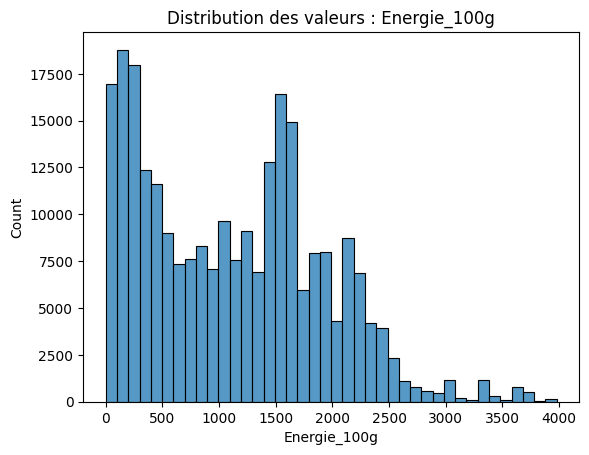

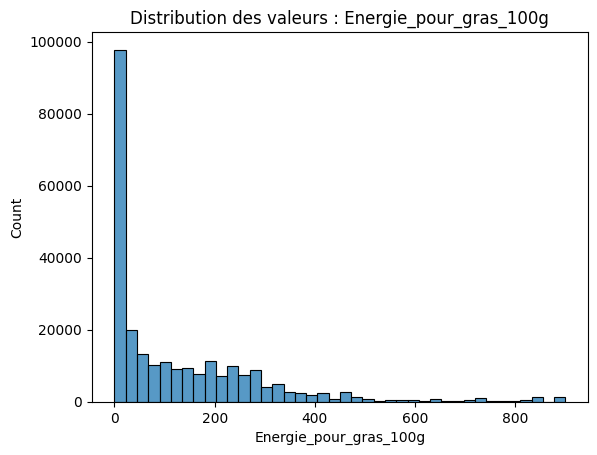

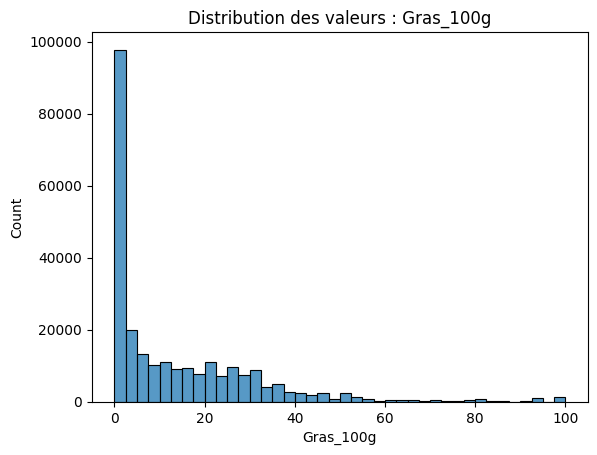

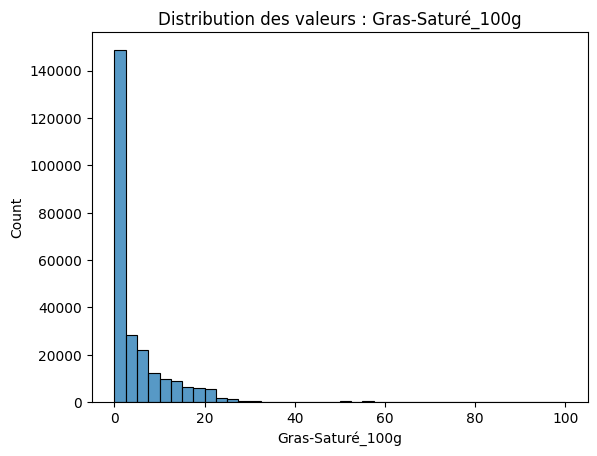

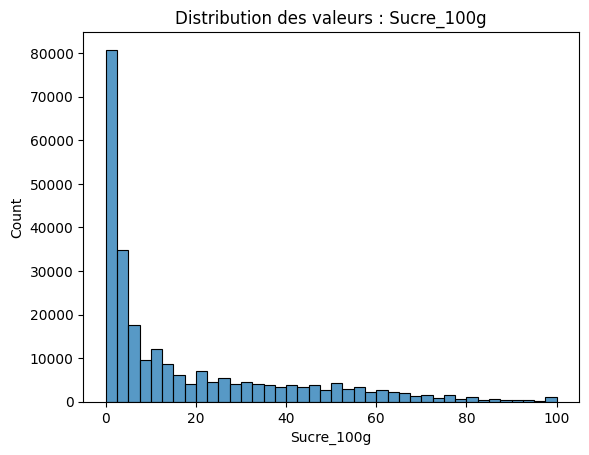

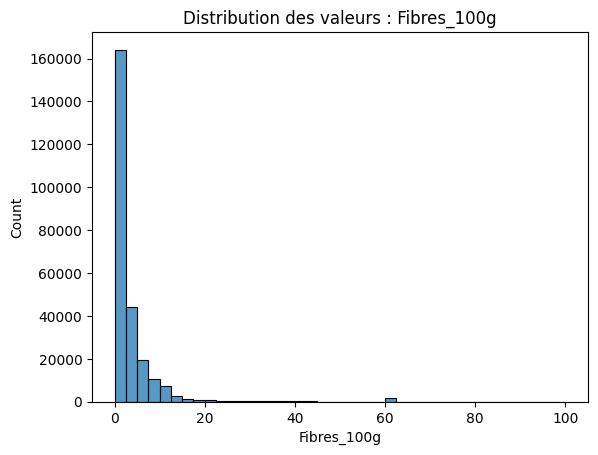

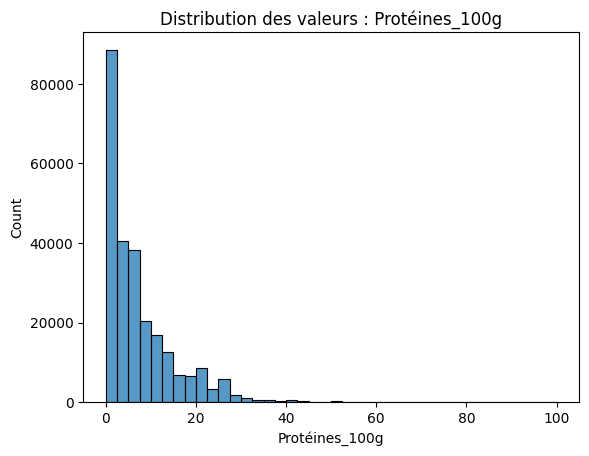

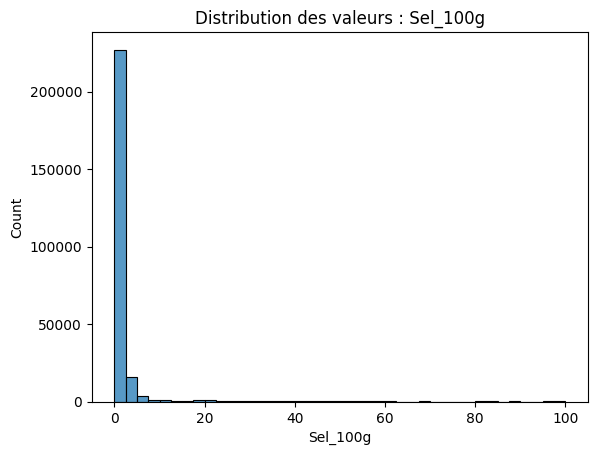

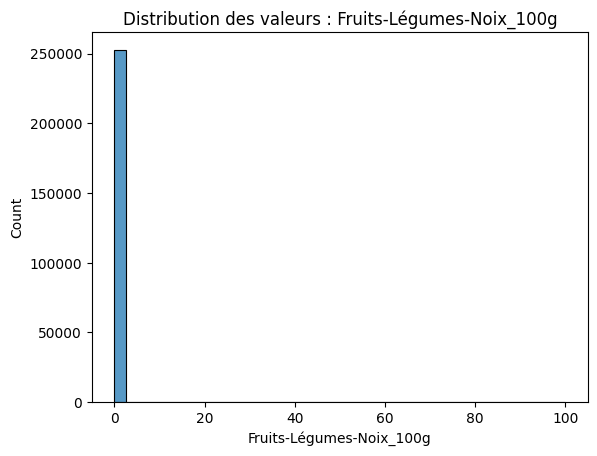

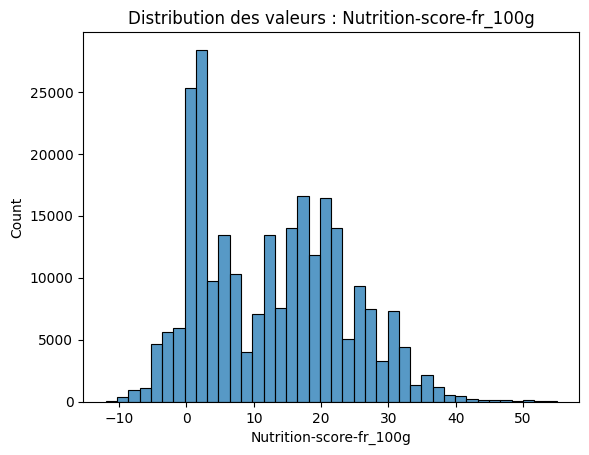

In [119]:
# Liste des colonne sutiles pour les graphiques en Français
columns_100g_trad = [
    "Energie_100g", "Energie_pour_gras_100g", "Gras_100g", "Gras-Saturé_100g",
    "Sucre_100g", "Fibres_100g", "Protéines_100g", "Sel_100g",
    "Fruits-Légumes-Noix_100g", "Nutrition-score-fr_100g"
]

nb_graphs = len(columns_100g_trad)

# Graphique de distribution des valeurs
for i in range(len(columns_100g_trad)):
    col = columns_100g_trad[i]
    df = graphs_data[col]

    sns.histplot(df, bins=40)
    plt.title(f"Distribution des valeurs : {col}")
    plt.show()

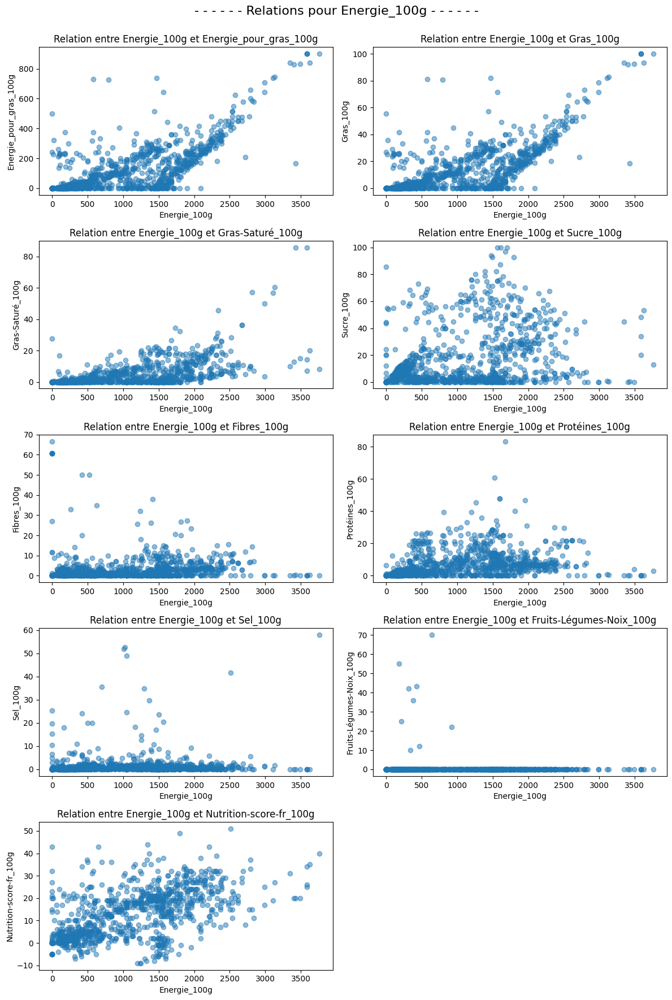

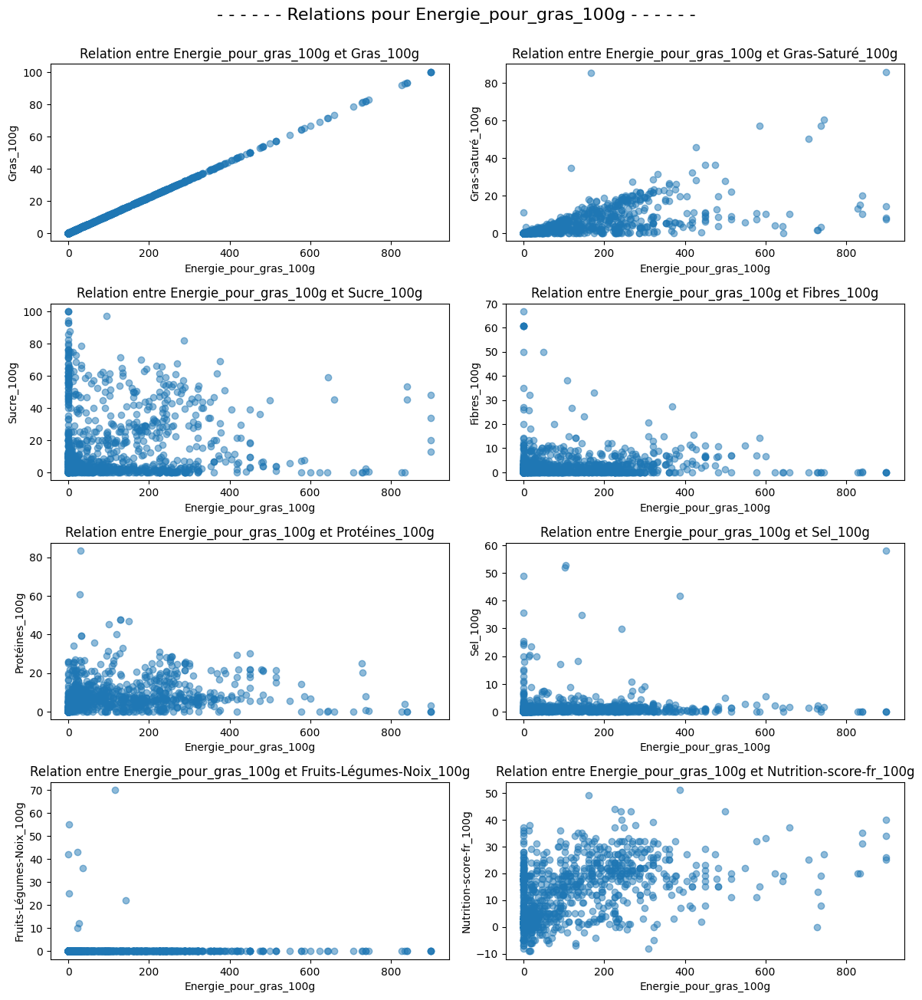

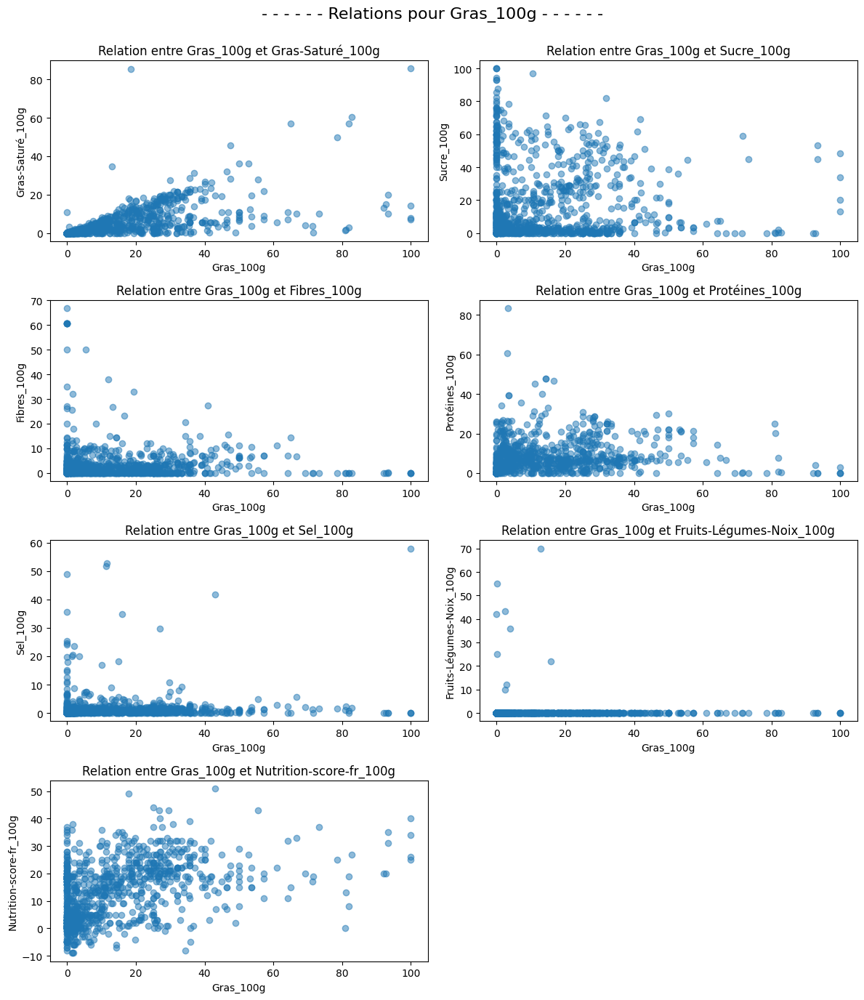

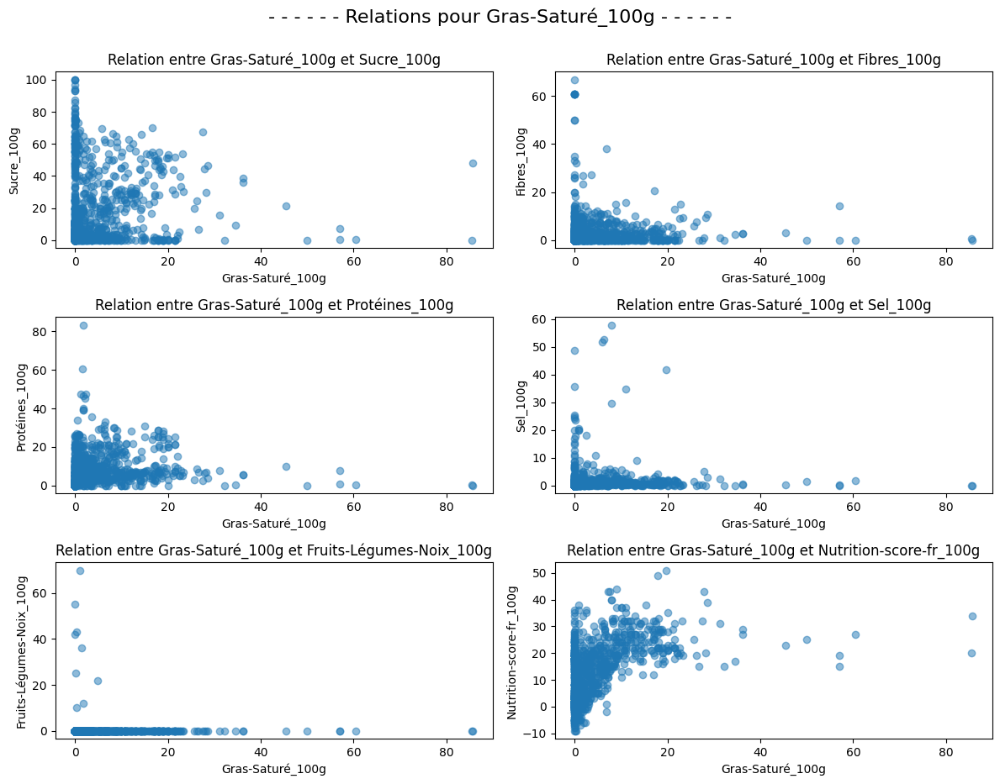

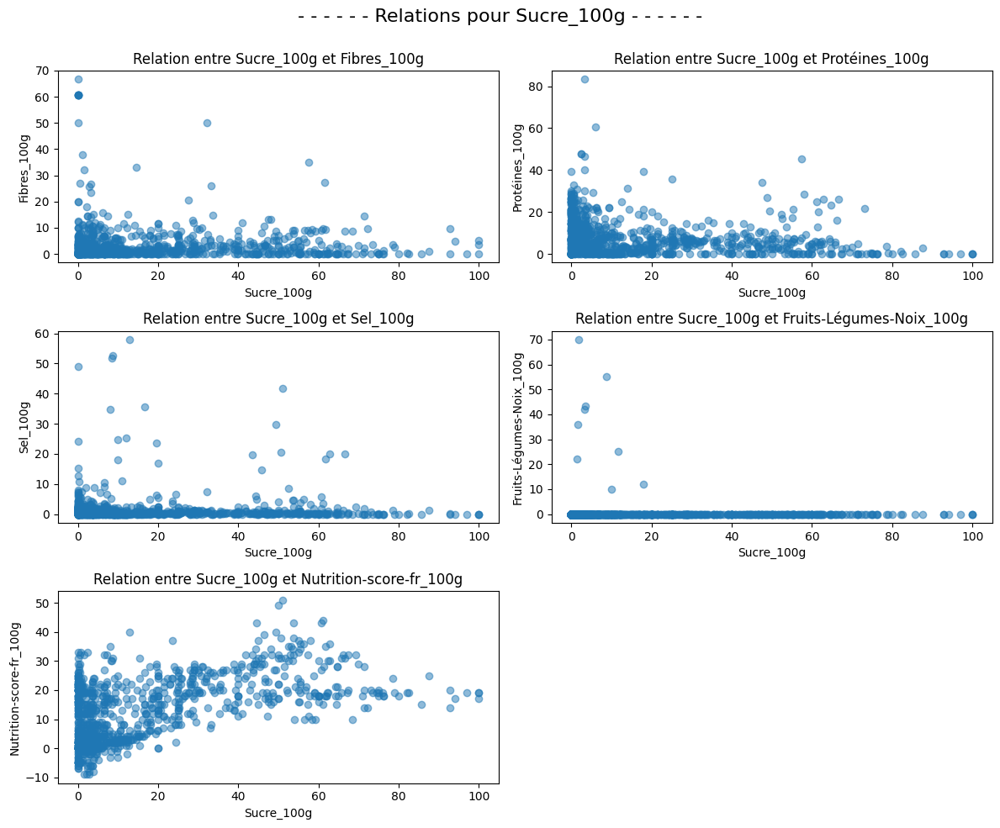

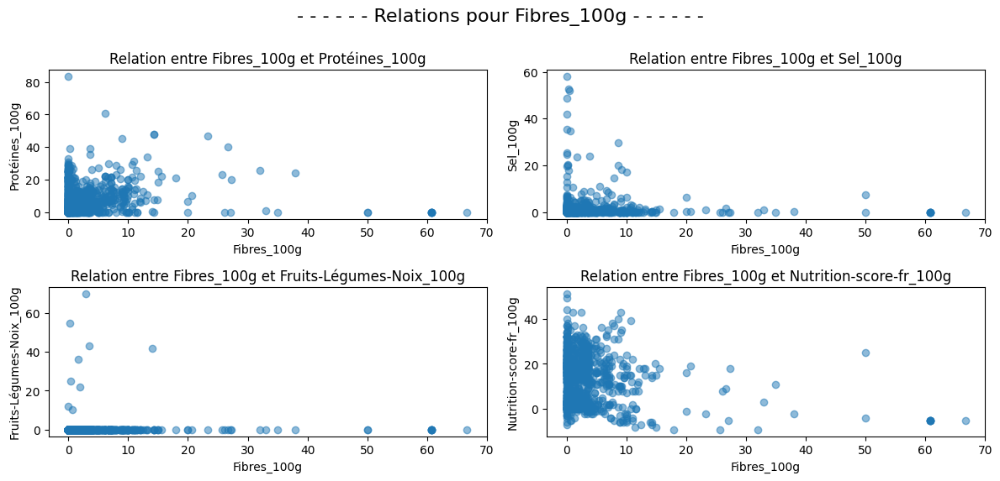

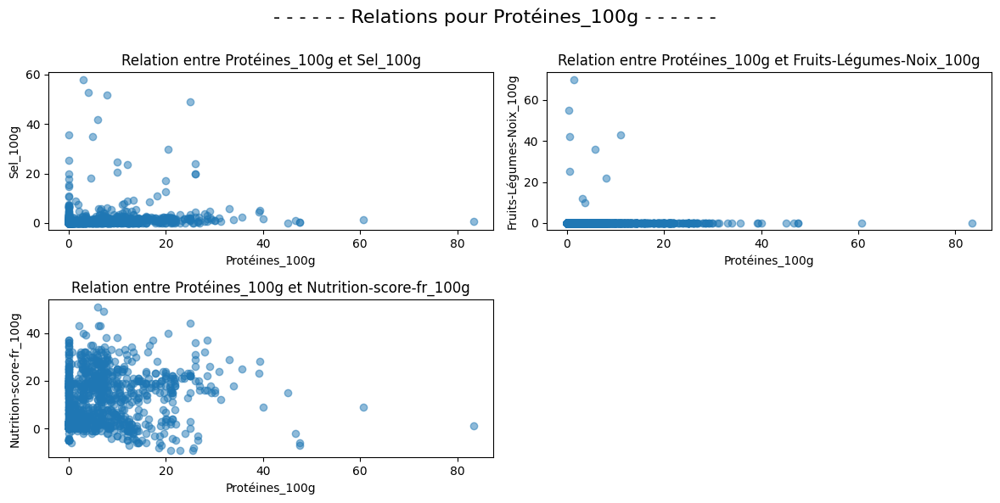

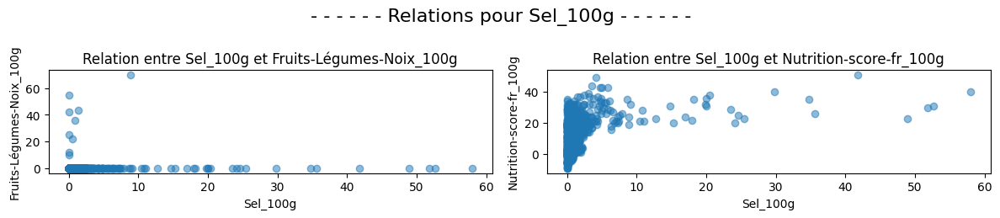

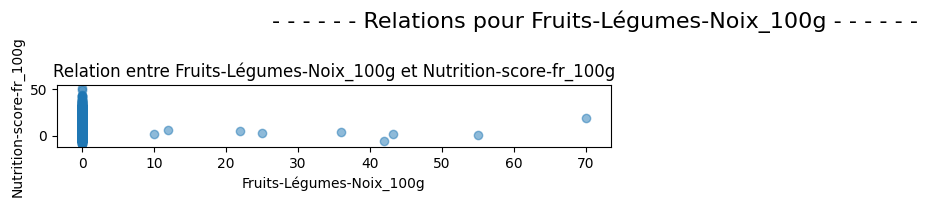

<Figure size 1200x0 with 0 Axes>

In [120]:
# Visualisation par 2 varaibles avec un échantillon de 1000 individus
graph_sample = graphs_data.sample(1000, random_state=42)
for i, col_x in enumerate(columns_100g_trad):
    nb_graphs = len(columns_100g) - (i + 1)

    plt.figure(figsize=(12, nb_graphs * 2))
    nb_sub = 1
    plt.suptitle(f"- - - - - - Relations pour {col_x} - - - - - -",
                 fontsize=16)

    for j in range(i + 1, len(columns_100g_trad)):

        col_y = columns_100g_trad[j]
        plt.subplot(nb_graphs // 2 + 1, 2, nb_sub)
        plt.scatter(graph_sample[col_x], graph_sample[col_y], alpha=0.5)
        plt.title(f"Relation entre {col_x} et {col_y}")
        plt.xlabel(col_x)
        plt.ylabel(col_y)

        nb_sub += 1

    plt.tight_layout(rect=(0, 0, 1, 0.98))
plt.show()

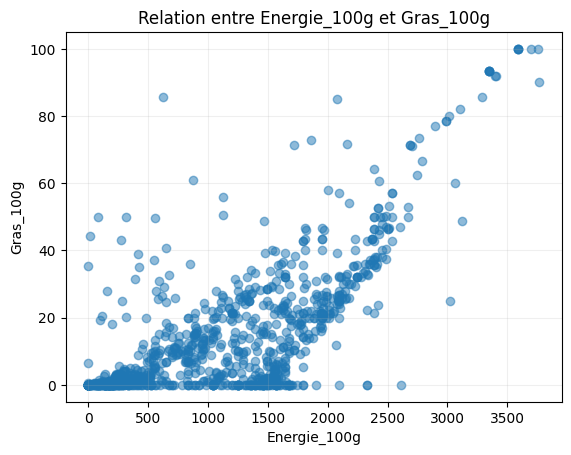

In [121]:
# Zoom sur la relation en l'énergie et le gras
graph_sample = graphs_data.sample(1000, random_state=4)
plt.scatter(graph_sample["Energie_100g"], graph_sample["Gras_100g"], alpha=0.5)
plt.title(f"Relation entre Energie_100g et Gras_100g")
plt.xlabel("Energie_100g")
plt.ylabel("Gras_100g")
plt.grid(alpha=0.2)
plt.show()

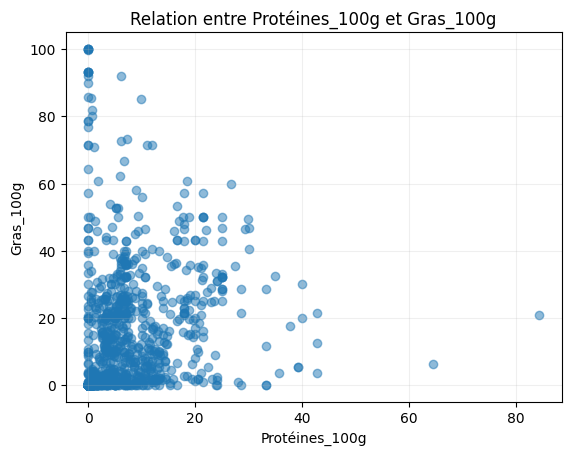

In [122]:
# Zoom sur la relation entre le gras et les protéines
plt.scatter(graph_sample["Protéines_100g"],
            graph_sample["Gras_100g"],
            alpha=0.5)
plt.title(f"Relation entre Protéines_100g et Gras_100g")
plt.xlabel("Protéines_100g")
plt.ylabel("Gras_100g")
plt.grid(alpha=0.2)
plt.show()

In [124]:
# Création d'un DataFrame avec les données regroupées par grade de nutriscore et on compte le nombre de lignes regroupées
counted_nutriscore_data = graphs_data.groupby("Nutrition_grade_fr").count()
counted_nutriscore_data["Nutrition_grade_fr"] = counted_nutriscore_data.index
counted_nutriscore_data

,Nom_produits,Marque,Pays,Additifs,Energie_100g,Energie_pour_gras_100g,Gras_100g,Gras-Saturé_100g,Sucre_100g,Fibres_100g,Protéines_100g,Sel_100g,Fruits-Légumes-Noix_100g,Nutrition-score-fr_100g,Nb_pays,Nutrition_grade_fr
Nutrition_grade_fr,,,,,,,,,,,,,,,,
A,32901,32901,32901,32901,32901,32901,32901,32901,32901,32901,32901,32901,32901,32901,32901,A
B,24571,24571,24571,24571,24571,24571,24571,24571,24571,24571,24571,24571,24571,24571,24571,B
C,55885,55885,55885,55885,55885,55885,55885,55885,55885,55885,55885,55885,55885,55885,55885,C
D,55133,55133,55133,55133,55133,55133,55133,55133,55133,55133,55133,55133,55133,55133,55133,D
E,85457,85457,85457,85457,85457,85457,85457,85457,85457,85457,85457,85457,85457,85457,85457,E


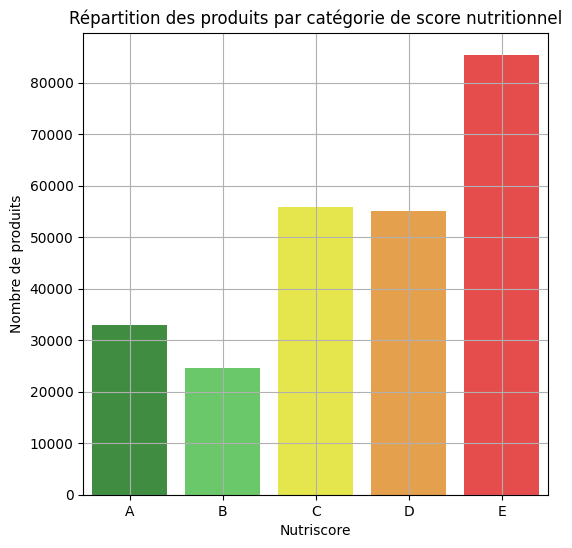

In [125]:
# Graphique de distribution du nombre de produits par nutriscore
plt.figure(figsize=(6,6))
sns.barplot(data=counted_nutriscore_data,
            x="Nutrition_grade_fr",
            y="Nom_produits",
            palette=colors, alpha=0.8)
plt.xlabel('Nutriscore')
plt.ylabel('Nombre de produits')
plt.grid()
plt.title('Répartition des produits par catégorie de score nutritionnel')
plt.show()

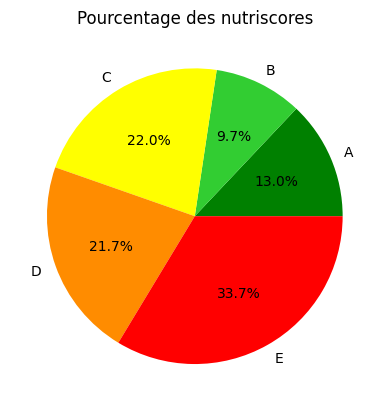

In [126]:
# Graphique camembert pour voir la proportion de chaque nutriscore
plt.pie(counted_nutriscore_data['Nom_produits'],
        labels=counted_nutriscore_data.index,
        colors=colors,
        autopct='%1.1f%%')
plt.title("Pourcentage des nutriscores")
plt.show()

In [127]:
# liste des nutriments utiles en Français
nutrition_score_columns = ["Energie_100g", "Energie_pour_gras_100g", "Gras_100g", "Gras-Saturé_100g", "Sucre_100g",
    "Fibres_100g", "Protéines_100g", "Sel_100g", "Fruits-Légumes-Noix_100g", "Nutrition_grade_fr"]

# Création d'un DataFrame avec les moyenne de chaque colonnes par nutrsiscore
mean_nutriscore_data = graphs_data[nutrition_score_columns].groupby(
    "Nutrition_grade_fr").mean()
mean_nutriscore_data

,Energie_100g,Energie_pour_gras_100g,Gras_100g,Gras-Saturé_100g,Sucre_100g,Fibres_100g,Protéines_100g,Sel_100g,Fruits-Légumes-Noix_100g
Nutrition_grade_fr,,,,,,,,,
A,608.280303,41.823206,4.647023,0.400035,2.325824,7.050541,8.351802,0.185952,0.334221
B,445.403294,37.837003,4.204111,0.506526,4.954650,1.648145,4.500469,0.317078,0.599318
C,663.328007,69.144607,7.682734,1.306107,8.105213,2.304879,4.925227,0.668097,0.335731
D,1353.176167,144.512165,16.056907,4.319355,21.212547,3.446214,7.903412,0.996925,0.102438
E,1661.427503,209.892176,23.321353,9.644221,30.189071,2.016515,8.102686,4.032636,0.012248


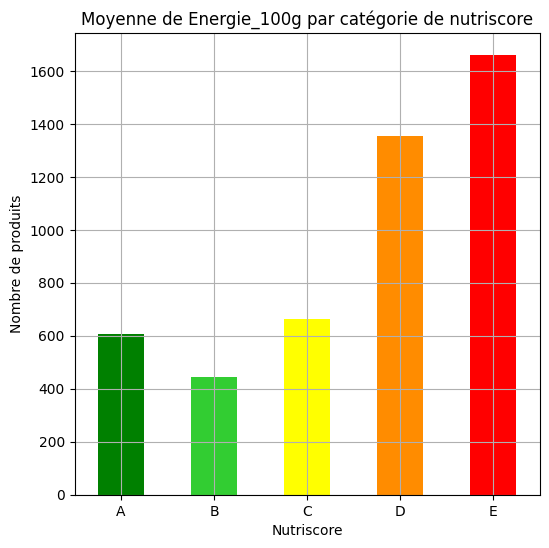

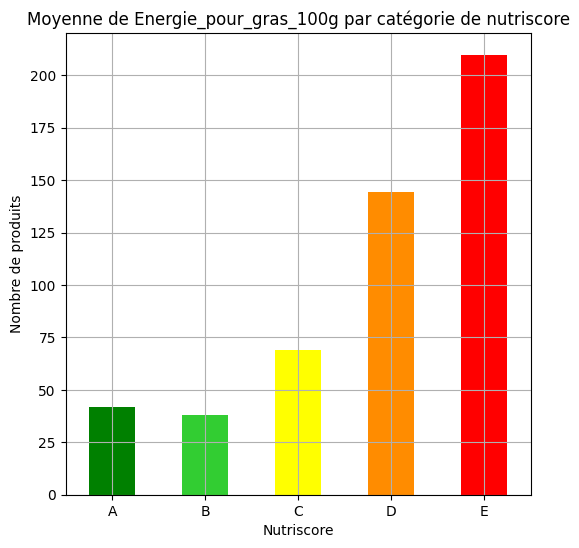

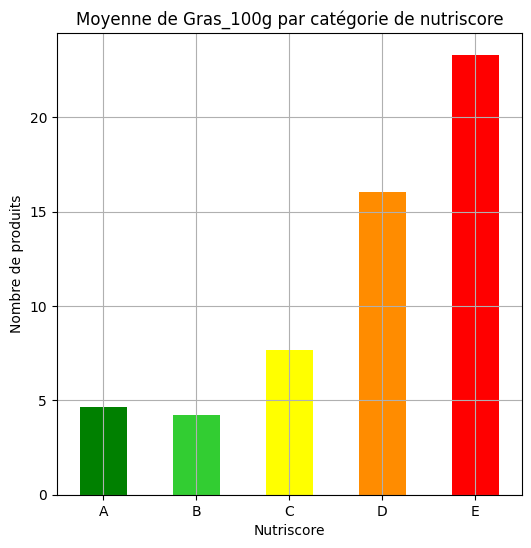

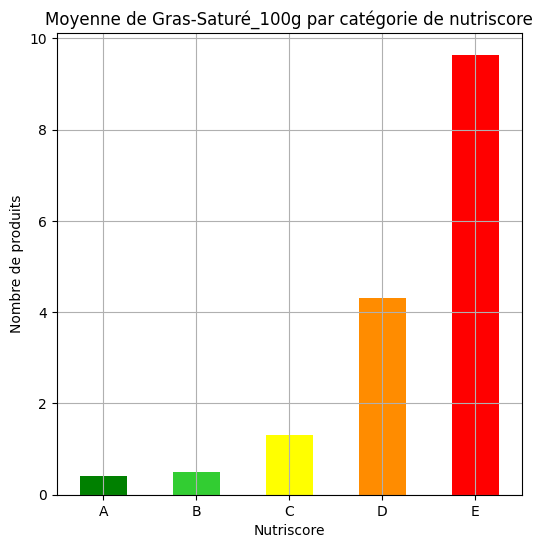

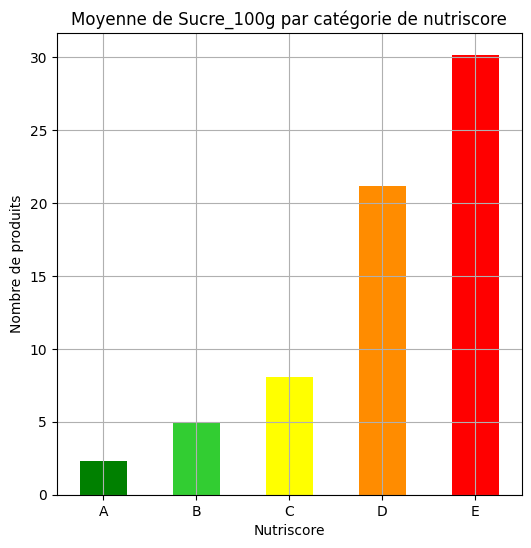

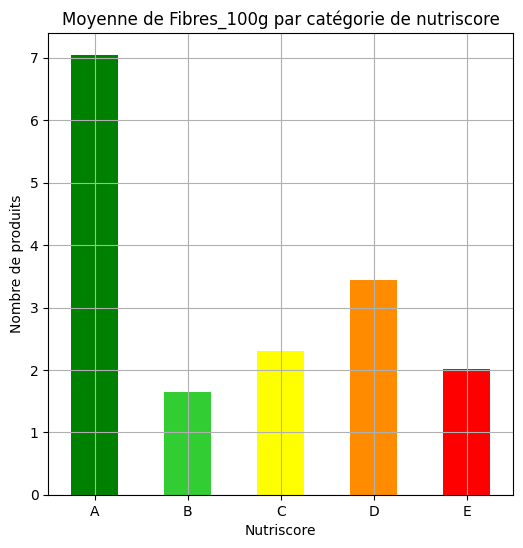

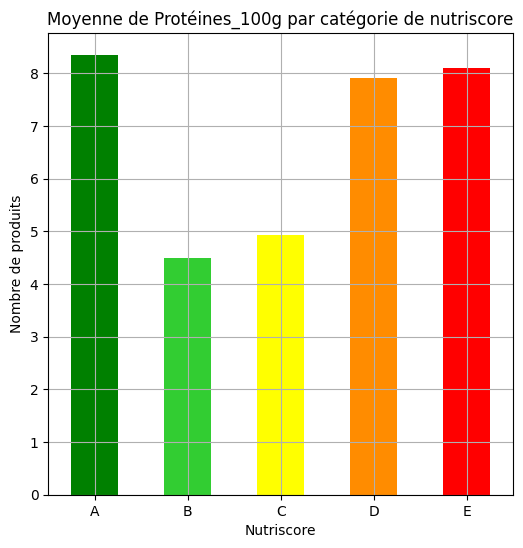

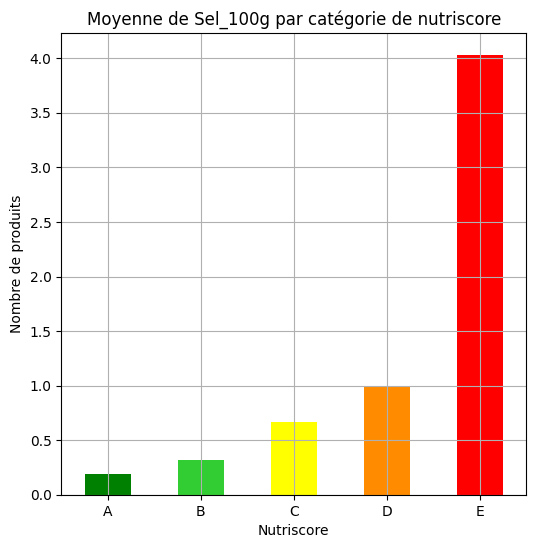

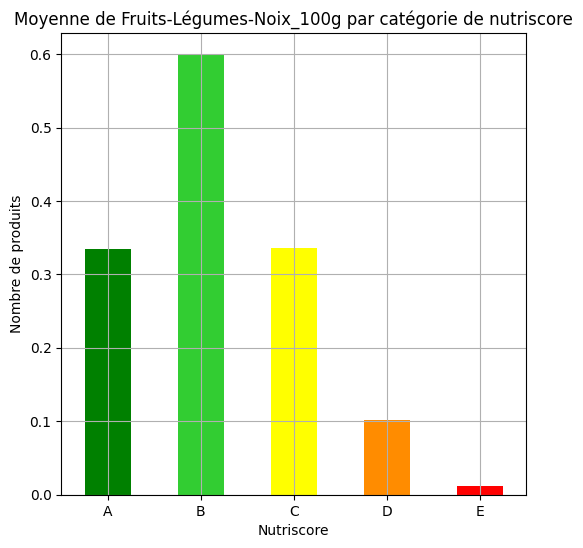

In [128]:
# Affichage des moyennes pour chaque nutriscore par nutriments
for col in columns_100g_trad[:-1]:
    df = mean_nutriscore_data[col]
    df.plot(kind="bar",
            figsize=(6, 6),
            title=f"Moyenne de {col} par catégorie de nutriscore",
            color=colors)
    plt.xticks(rotation=0)
    plt.xlabel("Nutriscore")
    plt.ylabel("Nombre de produits")
    plt.grid()
    plt.show()

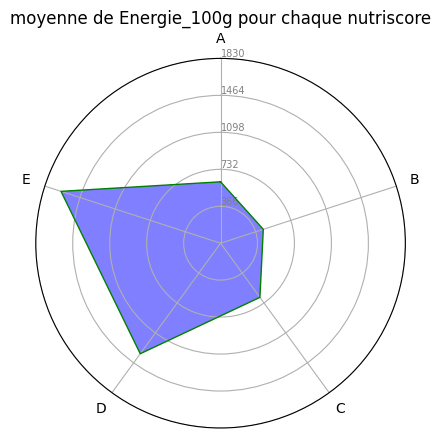

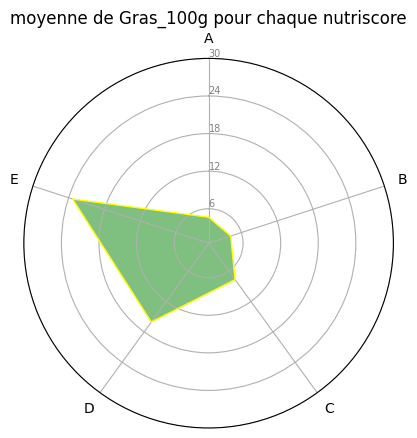

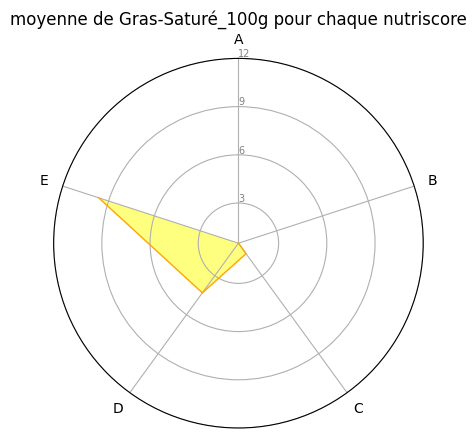

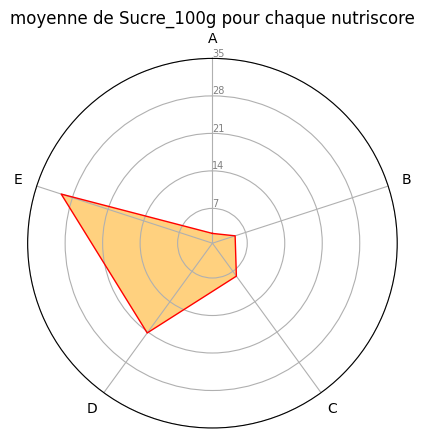

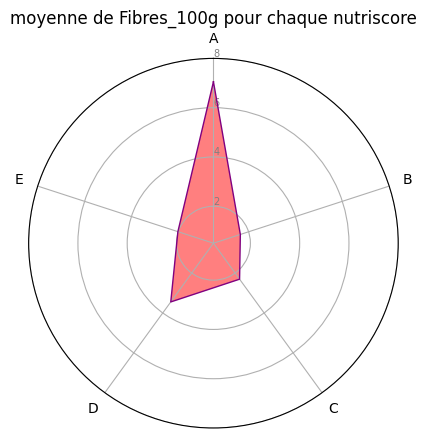

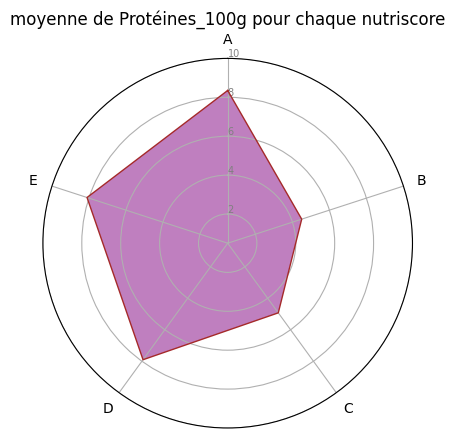

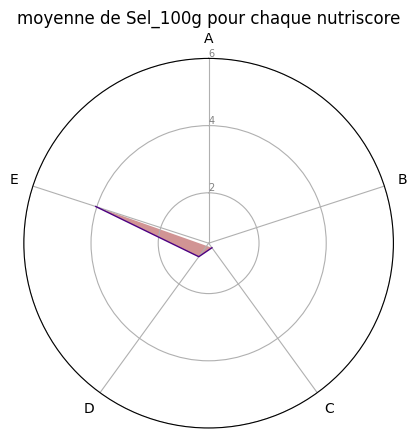

In [129]:
# Même visuel mais sous forme de Graphique Araignée
radar_data = mean_nutriscore_data.drop(
    columns=['Energie_pour_gras_100g', 'Fruits-Légumes-Noix_100g'])
radar_colors = [
    "blue", "green", "yellow", "orange", "red", "purple", "brown", "indigo"
]

graph_categories = list(radar_data.index)
N = len(graph_categories)

# Calcul des angles de chaques axes
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

for i, col in enumerate(radar_data.columns):
    df = radar_data.loc[:, col]
    value_max = int(np.ceil(df.max()) * 1.1)
    increment = int(value_max // 5) + 1
    radar_yticks = range(0, value_max + increment, increment)
    ax = plt.subplot(111, projection="polar")

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Définir les angles pour chaque axe et les étiquettes associées
    ax.set_xticks(ticks=angles[:-1], labels=graph_categories)

    #on change les valeurs des cercles
    ax.set_rlabel_position(0)
    plt.yticks(radar_yticks, radar_yticks, color="grey", size=7)
    plt.ylim(0.5)

    values = df.values.flatten().tolist()
    values += values[:1]
    ax.plot(angles,
            values,
            linewidth=1,
            linestyle="solid",
            label=col,
            color=radar_colors[i + 1])
    ax.fill(angles, values, radar_colors[i], alpha=0.5)

    plt.title(f"moyenne de {col} pour chaque nutriscore")

    plt.show()

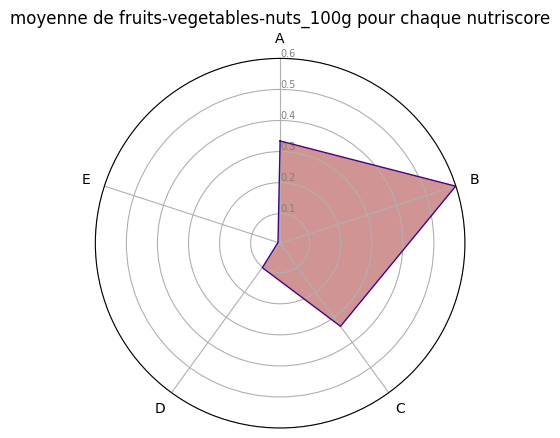

In [130]:
# Besoin de modifier l'échelle des données pour la colonne Fruits-légumes-Noix_100g
df = mean_nutriscore_data.loc[:, "Fruits-Légumes-Noix_100g"] * 100
ax = plt.subplot(111, projection="polar")

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)

# Définir les angles pour chaque axe et les étiquettes associées
ax.set_xticks(ticks=angles[:-1], labels=graph_categories)

#on change les valeurs des cercles
ax.set_rlabel_position(0)
ax.set_yticks([10,20,30,40,50,60],["0.1", "0.2", "0.3", "0.4" , "0.5", "0.6"], color="grey", size=7)
plt.ylim(0.5)

values = df.values.flatten().tolist()
values += values[:1]
ax.plot(angles,
        values,
        linewidth=1,
        linestyle="solid",
        label="fruits-vegetables-nuts_100g", color=radar_colors[i+1])
ax.fill(angles, values, radar_colors[i], alpha=0.5)

plt.title(f"moyenne de fruits-vegetables-nuts_100g pour chaque nutriscore")

plt.show()

In [131]:
# Cr"ation de 5 Datarame, un pour chaque nutriscore
nutriscore_A_data = graphs_data[
    graphs_data["Nutrition_grade_fr"] == "A"]
nutriscore_B_data = graphs_data[
    graphs_data["Nutrition_grade_fr"] == "B"]
nutriscore_C_data = graphs_data[
    graphs_data["Nutrition_grade_fr"] == "C"]
nutriscore_D_data = graphs_data[
    graphs_data["Nutrition_grade_fr"] == "D"]
nutriscore_E_data = graphs_data[
    graphs_data["Nutrition_grade_fr"] == "E"]

In [132]:
nutriscore_A_data.head()

,Nom_produits,Marque,Pays,Additifs,Nutrition_grade_fr,Energie_100g,Energie_pour_gras_100g,Gras_100g,Gras-Saturé_100g,Sucre_100g,Fibres_100g,Protéines_100g,Sel_100g,Fruits-Légumes-Noix_100g,Nutrition-score-fr_100g,Nb_pays
14,Organic Hazelnuts,Grizzlies,États-Unis,0.0,A,2632.0,546.39,60.71,3.570,3.57,10.7,14.29,0.01016,0.0,0,1
17,Organic Oat Groats,Pcc,États-Unis,0.0,A,1096.0,53.55,5.95,1.190,2.38,9.5,16.67,0.02540,0.0,-7,1
24,Organic Unswt Berry Coconut Granola,New England Naturals,États-Unis,0.0,A,1548.0,199.98,22.22,4.630,5.56,9.3,12.96,0.28194,0.0,0,1
29,Organic Red Quinoa,Pcc,États-Unis,0.0,A,1490.0,60.03,6.67,0.400,11.11,8.9,13.33,0.01016,0.0,-3,1
44,Organic French Green Lentils,Crown Pacific Fine Foods,États-Unis,0.0,A,1490.0,165.60,18.40,4.556,4.44,15.6,26.67,0.08382,0.0,-3,1


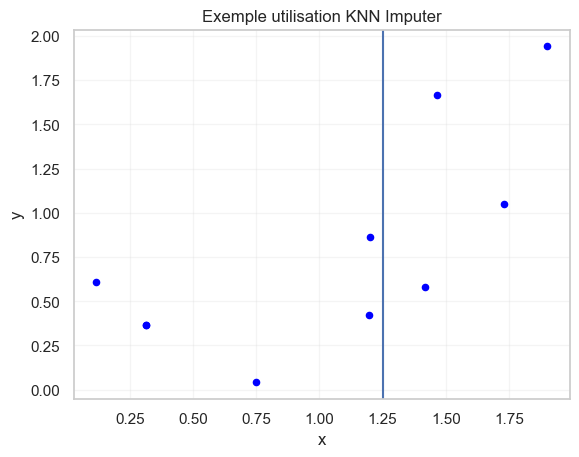

In [139]:
# Explication du KNNImputer
np.random.seed(42)
data = {
    "x": np.random.uniform(0, 2, 10),
    "y": np.random.uniform(0, 2, 10)
}
data = pd.DataFrame(data)

data.plot(kind="scatter", x="x", y="y", color="blue")
plt.axvline(1.25)
plt.title("Exemple utilisation KNN Imputer")
plt.grid(alpha=0.2)
plt.show()

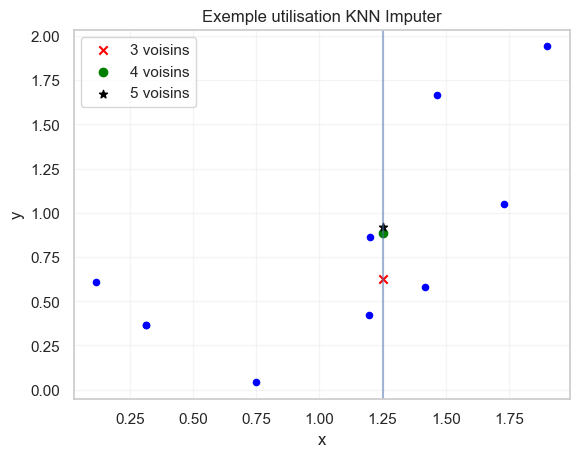

In [140]:
# Deuxième graphique pour expliquer
y_3 = data[(data["x"]>1) & (data["x"]<1.45)]["y"].mean()
y_4 = data[(data["x"]>1) & (data["x"]<1.5)]["y"].mean()
y_5 = data[(data["x"]>1) & (data["x"]<1.75)]["y"].mean()
x=1.25

data.plot(kind="scatter", x="x", y="y", color="blue")
plt.axvline(1.25, alpha=0.5)
plt.scatter(x=x, y=y_3, color="red", marker="x", label="3 voisins")
plt.scatter(x=x, y=y_4, color="green", marker="o", label="4 voisins")
plt.scatter(x=x, y=y_5, color="black", marker="*", label="5 voisins")
plt.title("Exemple utilisation KNN Imputer")
plt.grid(alpha=0.2)
plt.legend()
plt.show()

In [142]:
# Vérification des valeurs des points les plus proche 
data[(data["x"]>1) & (data["x"]<1.45)]

,x,y
3,1.197317,0.424678
8,1.202230,0.863890
9,1.416145,0.582458


# ACP

In [143]:
# Récupération des données utiles pour l'ACP et initiation du robust scaler
nutriments_data = transformed_data[nutriments_columns]
scaler = RobustScaler()

In [144]:
scaler.fit(nutriments_data)

RobustScaler()

In [145]:
# tranform des données
X_scaled = scaler.transform(nutriments_data)
X_scaled[:5]

array([[-1.81818182e-01,  4.89259097e-01,  4.33720930e-01,
         3.23082679e-02,  1.40860215e+00,  1.61111111e+00,
         0.00000000e+00],
       [ 6.30303030e-01,  2.21131083e+00, -1.20155039e-01,
         4.73221100e-01,  1.40860215e+00,  1.61111111e+00,
         0.00000000e+00],
       [-9.93939394e-02, -2.31039018e-01,  2.03604651e+00,
         2.97258371e+01,  4.09677419e-01,  1.22222222e+00,
         0.00000000e+00],
       [ 1.09090909e-01,  5.07233669e-01,  1.88759690e-01,
         1.67137018e+01,  9.35483871e-01,  1.77777778e+00,
         0.00000000e+00],
       [ 3.06363636e-01,  7.53090750e-01,  7.31937984e-01,
        -9.50243172e-03,  4.44086022e-01,  1.80000000e+00,
         0.00000000e+00]])

In [146]:
X_scaled.shape

(253947, 7)

In [147]:
# Nombre des composantes à trouver
n_components = 7

In [148]:
# création de l'ACP avec le bon nombre de composantes
pca = PCA(n_components=n_components)

In [149]:
pca.fit(X_scaled)

PCA(n_components=7)

In [150]:
# Visualisation des varainces exprimées par chaque composante
pca.explained_variance_ratio_

array([0.60507692, 0.24462534, 0.06914897, 0.04045915, 0.0210561 ,
       0.0125119 , 0.00712162])

In [151]:
# Récupération de ces variances
scree = (pca.explained_variance_ratio_ * 100).round(2)
scree

array([60.51, 24.46,  6.91,  4.05,  2.11,  1.25,  0.71])

In [152]:
# Calcul du cumul des vraince
scree_cum = scree.cumsum().round()
scree_cum

array([ 61.,  85.,  92.,  96.,  98.,  99., 100.])

In [153]:
# création d'un range en fonction du nombre de composantes pour les graphiques
x_list = range(1, n_components+1)
list(x_list)

[1, 2, 3, 4, 5, 6, 7]

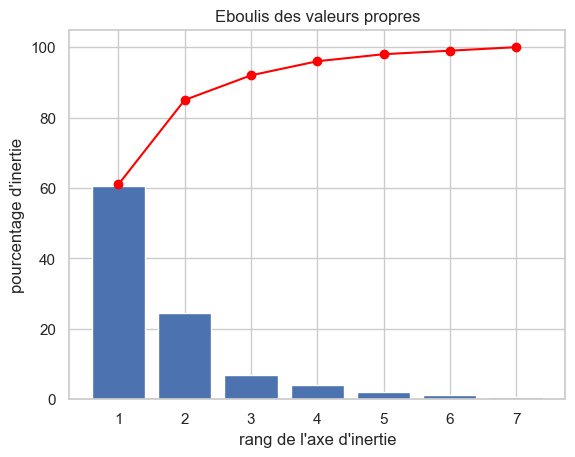

In [154]:
# Affchage des variances et de leur cumul
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum, c="red", marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

In [155]:
# récupération de toute les composantes
pcs = pca.components_
pcs

array([[-9.86701226e-03, -7.73517581e-03, -7.75078853e-04,
         9.99796877e-01, -6.73929865e-04, -8.51916431e-03,
        -1.32432153e-02],
       [-1.44128851e-02, -1.19612882e-02, -4.79612707e-03,
         1.28934296e-02, -1.19332627e-02, -1.17933279e-02,
         9.99589149e-01],
       [-6.38891513e-02, -1.58088745e-02, -1.43814904e-02,
         7.90843271e-03,  5.53794881e-02,  9.96096421e-01,
         1.11318594e-02],
       [ 8.37181880e-01,  4.84349377e-01,  1.36483131e-02,
         1.28734822e-02,  2.47941573e-01,  4.74557463e-02,
         2.12862831e-02],
       [-1.79199005e-01,  9.34645271e-03, -7.45809560e-01,
        -2.32245697e-03,  6.38937579e-01, -5.76279157e-02,
         9.27334049e-04],
       [-1.63778392e-01, -1.02045636e-01,  6.61288971e-01,
        -1.66822270e-03,  7.23573726e-01, -4.28781022e-02,
         7.74412019e-03],
       [ 4.85596480e-01, -8.68592072e-01, -7.77707503e-02,
        -1.87551660e-03,  5.92879783e-02,  1.29886807e-02,
        -2.8799548

In [156]:
# Mise en forme de DataFrame
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6
0,-0.009867,-0.007735,-0.000775,0.999797,-0.000674,-0.008519,-0.013243
1,-0.014413,-0.011961,-0.004796,0.012893,-0.011933,-0.011793,0.999589
2,-0.063889,-0.015809,-0.014381,0.007908,0.055379,0.996096,0.011132
3,0.837182,0.484349,0.013648,0.012873,0.247942,0.047456,0.021286
4,-0.179199,0.009346,-0.745810,-0.002322,0.638938,-0.057628,0.000927
5,-0.163778,-0.102046,0.661289,-0.001668,0.723574,-0.042878,0.007744
6,0.485596,-0.868592,-0.077771,-0.001876,0.059288,0.012989,-0.002880


In [157]:
# Changement du nom des colonnes et de l'index
pcs.columns = nutriments_columns
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g
F1,-0.01,-0.01,-0.00,1.00,-0.00,-0.01,-0.01
F2,-0.01,-0.01,-0.00,0.01,-0.01,-0.01,1.00
F3,-0.06,-0.02,-0.01,0.01,0.06,1.00,0.01
F4,0.84,0.48,0.01,0.01,0.25,0.05,0.02
F5,-0.18,0.01,-0.75,-0.00,0.64,-0.06,0.00
F6,-0.16,-0.10,0.66,-0.00,0.72,-0.04,0.01
F7,0.49,-0.87,-0.08,-0.00,0.06,0.01,-0.00


In [158]:
# Transposée du DataFrame
pcs.T

,F1,F2,F3,F4,F5,F6,F7
saturated-fat_100g,-0.009867,-0.014413,-0.063889,0.837182,-0.179199,-0.163778,0.485596
fat_100g,-0.007735,-0.011961,-0.015809,0.484349,0.009346,-0.102046,-0.868592
sugars_100g,-0.000775,-0.004796,-0.014381,0.013648,-0.745810,0.661289,-0.077771
salt_100g,0.999797,0.012893,0.007908,0.012873,-0.002322,-0.001668,-0.001876
proteins_100g,-0.000674,-0.011933,0.055379,0.247942,0.638938,0.723574,0.059288
fiber_100g,-0.008519,-0.011793,0.996096,0.047456,-0.057628,-0.042878,0.012989
fruits-vegetables-nuts_100g,-0.013243,0.999589,0.011132,0.021286,0.000927,0.007744,-0.002880


<Axes: >

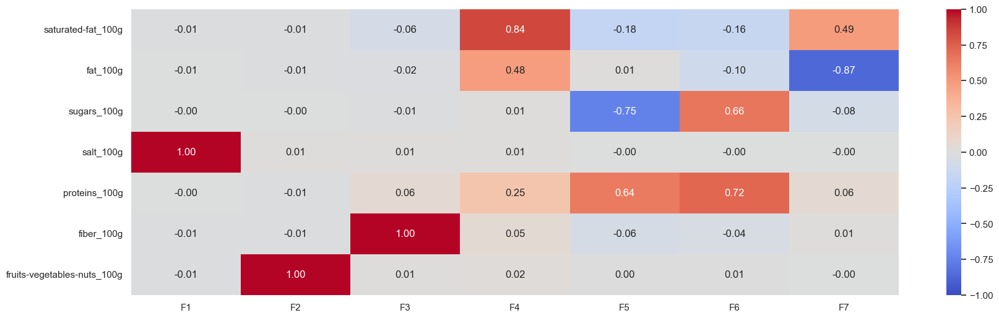

In [159]:
# Affichage de la heatmap des composantes principales
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

In [160]:
x, y = 0, 1
x_y = (0, 1)

In [162]:
X_scaled = scaler.transform(nutriments_data)
X_scaled[:5]

array([[-1.81818182e-01,  4.89259097e-01,  4.33720930e-01,
         3.23082679e-02,  1.40860215e+00,  1.61111111e+00,
         0.00000000e+00],
       [ 6.30303030e-01,  2.21131083e+00, -1.20155039e-01,
         4.73221100e-01,  1.40860215e+00,  1.61111111e+00,
         0.00000000e+00],
       [-9.93939394e-02, -2.31039018e-01,  2.03604651e+00,
         2.97258371e+01,  4.09677419e-01,  1.22222222e+00,
         0.00000000e+00],
       [ 1.09090909e-01,  5.07233669e-01,  1.88759690e-01,
         1.67137018e+01,  9.35483871e-01,  1.77777778e+00,
         0.00000000e+00],
       [ 3.06363636e-01,  7.53090750e-01,  7.31937984e-01,
        -9.50243172e-03,  4.44086022e-01,  1.80000000e+00,
         0.00000000e+00]])

In [163]:
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[-8.55287393e-01, -2.31860623e-01,  1.22924754e+00,
        -1.71292770e-01,  7.89704839e-01,  9.02579081e-01,
        -3.97753750e-01],
       [-4.35368406e-01, -2.55822252e-01,  1.16159060e+00,
         1.34079169e+00,  1.07233059e+00,  2.26835700e-01,
        -1.45690262e+00],
       [ 2.88397127e+01,  1.67240291e-01,  1.00446330e+00,
        -3.13166455e-01, -1.11162911e+00,  1.26652699e+00,
         2.33362530e-02],
       [ 1.58187972e+01, -1.63329328e-02,  1.48563906e+00,
         1.82964939e-01,  5.69797133e-01,  3.13799479e-01,
        -3.10222748e-01],
       [-9.05137581e-01, -2.34739672e-01,  1.32400481e+00,
         1.38543026e-01, -1.44777867e-01,  2.86982251e-01,
        -4.67701401e-01]])

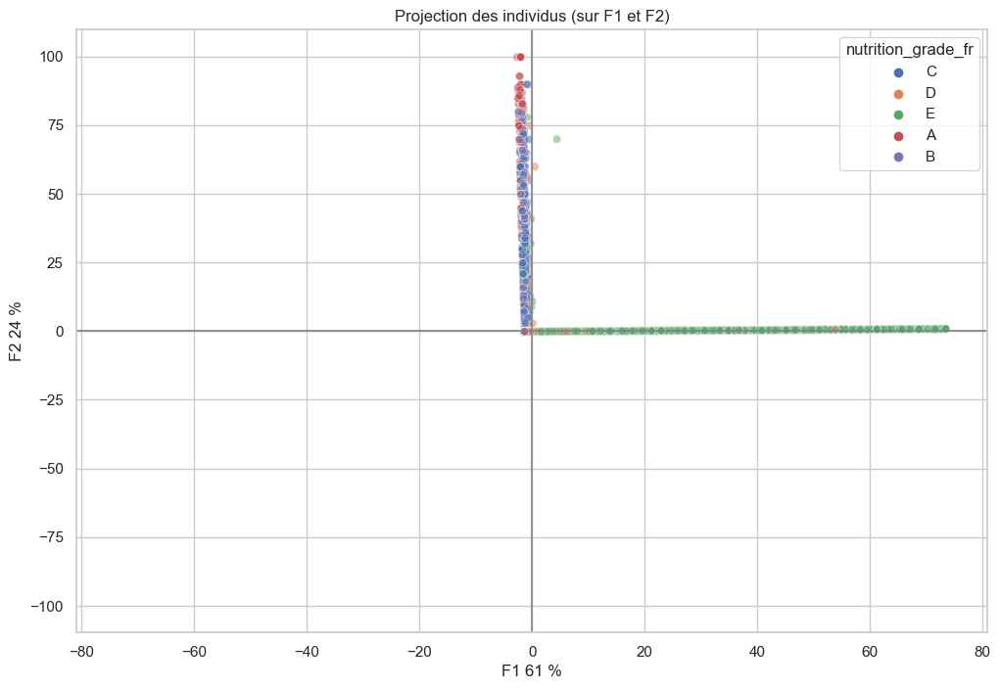

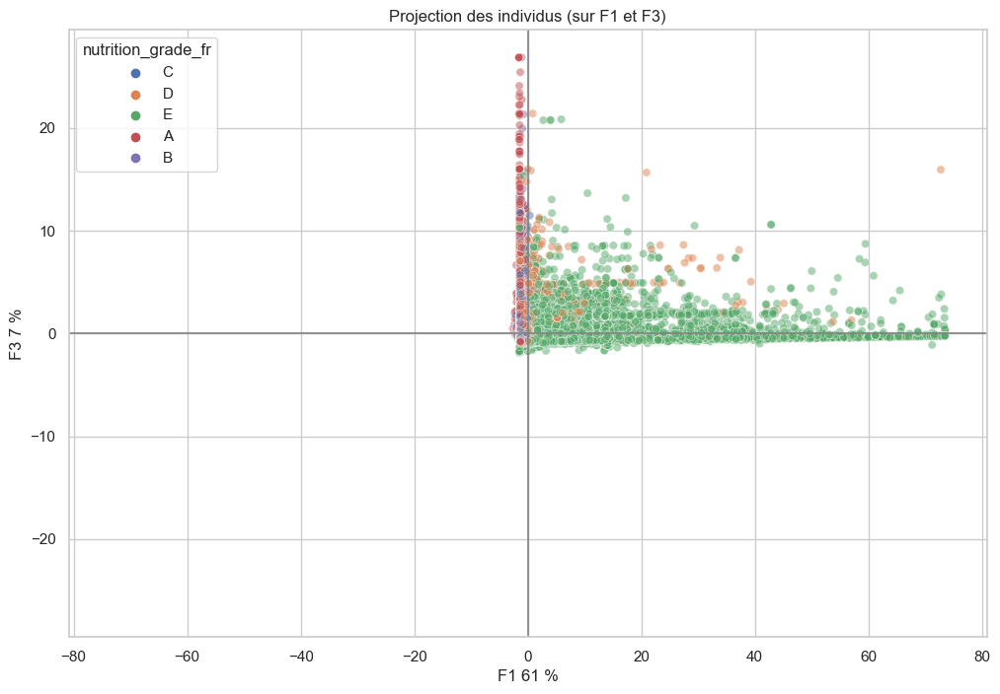

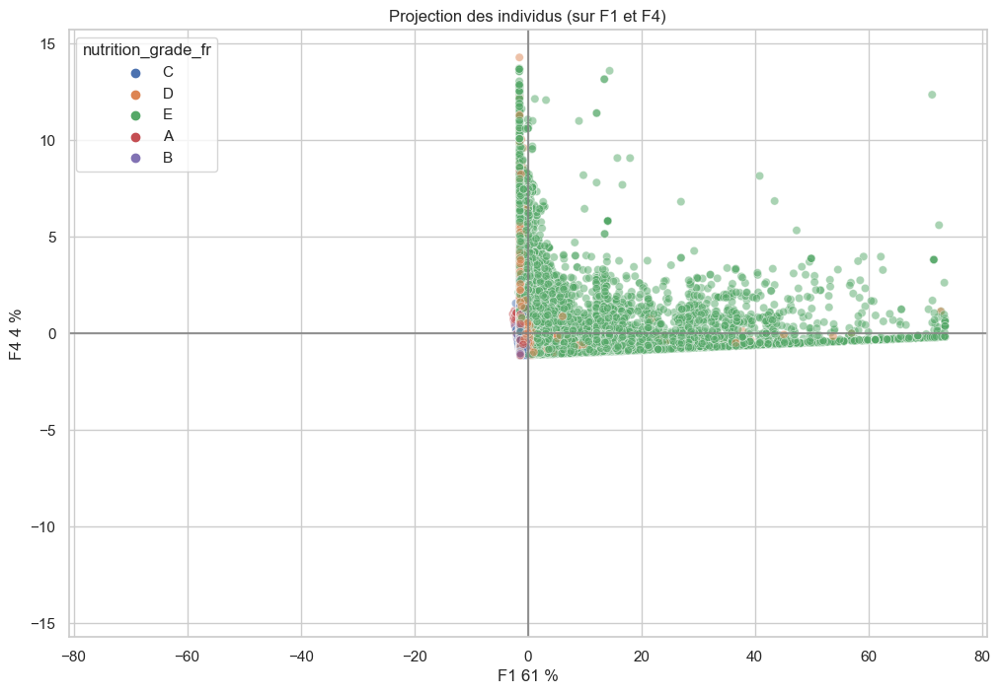

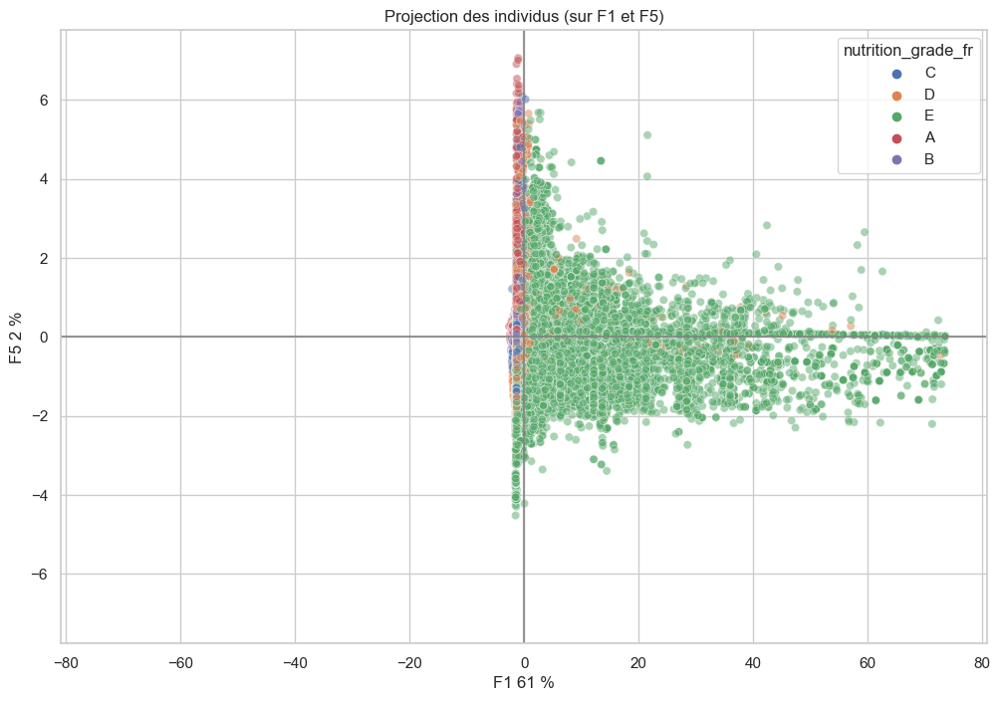

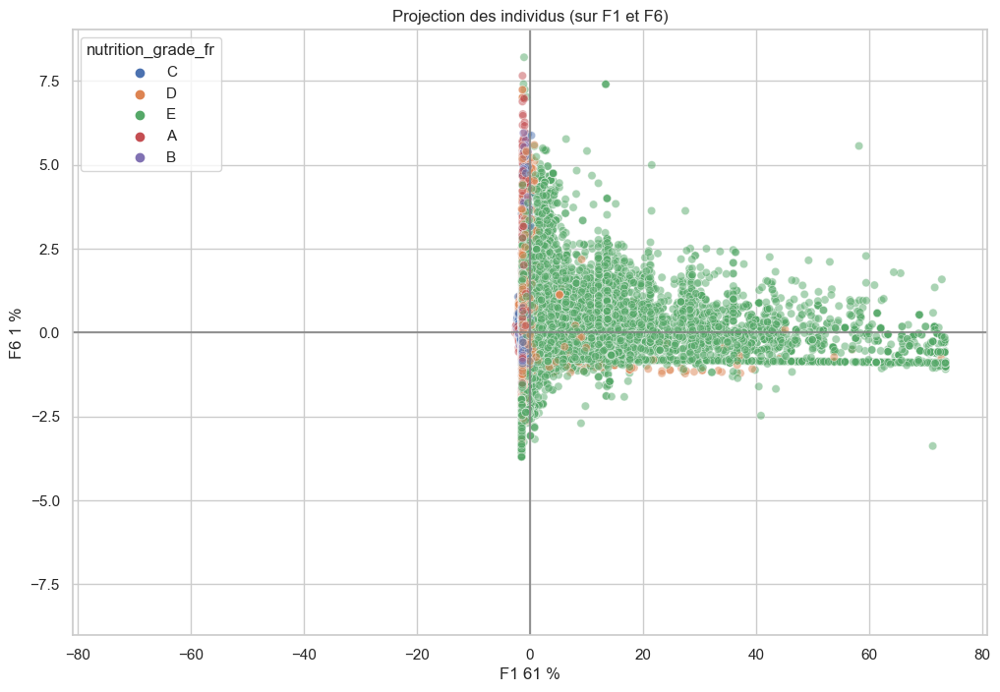

...

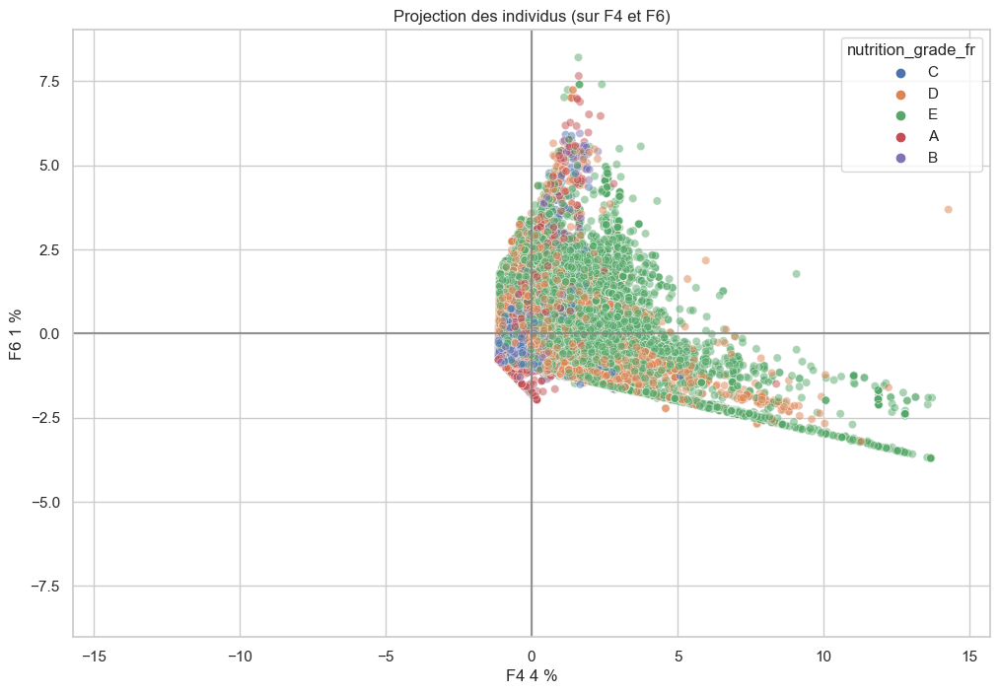

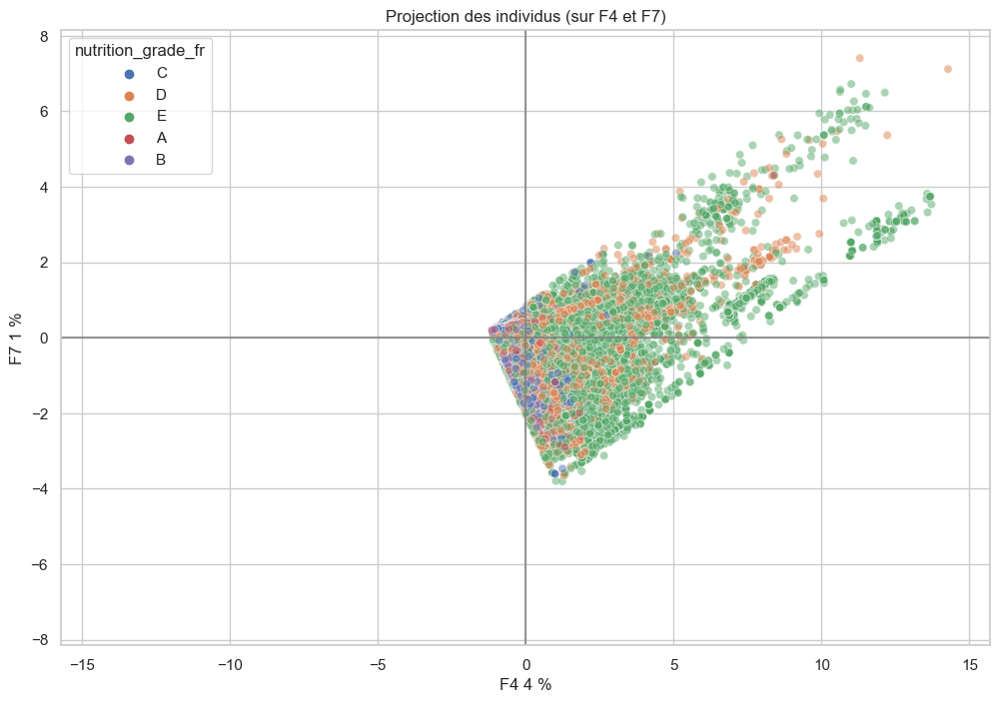

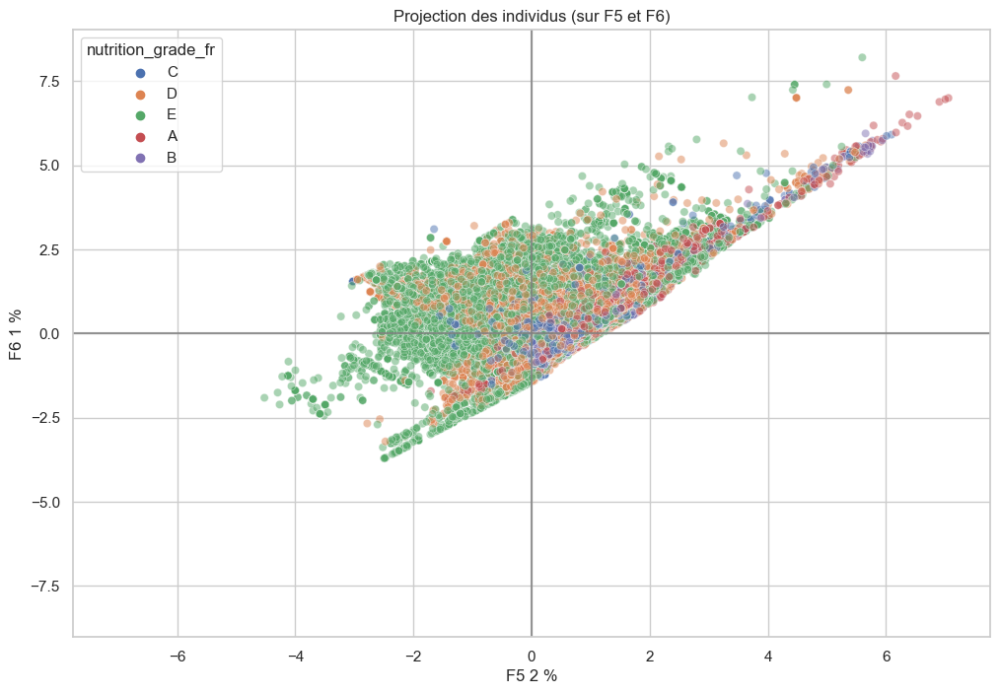

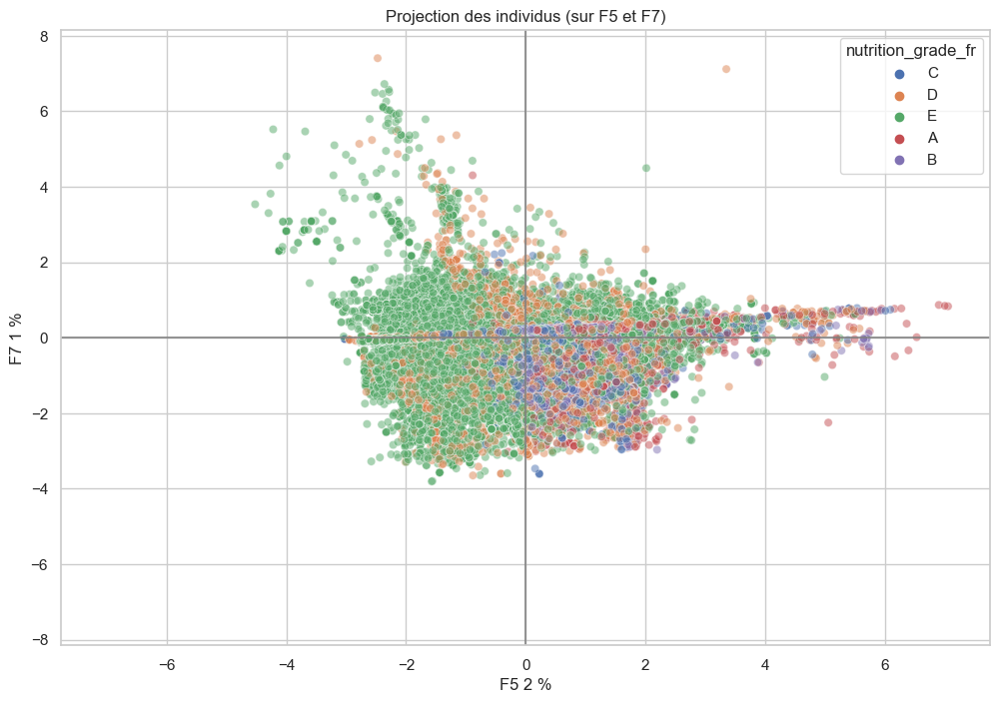

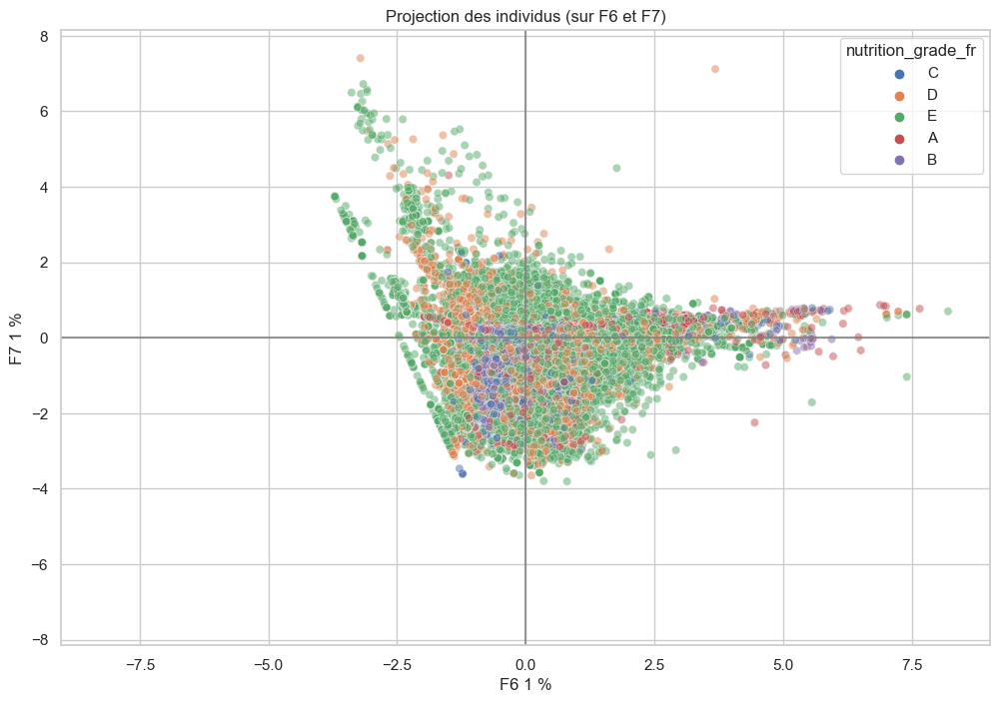

In [166]:
# Affichage des graphiques de projection des individus
for x in range(0, n_components):
    for y in range(x + 1, n_components):
        x_y = (x, y)
        display_factorial_planes(
            X_proj,
            x_y,
            pca,
            figsize=(12, 8),
            clusters=transformed_data["nutrition_grade_fr"],
            alpha=0.5)

# Clustering

In [167]:
# Création du DataFrame utilisé pour créer les clusters
nutriments_with_energy_data = transformed_data[nutriments_with_energy_columns].copy()
nutriments_with_energy_data.head()

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g
0,1941.0,160.740,2.220446e-16,17.860,17.860,0.635000,17.86,7.10,0.0
1,2540.0,514.260,5.360000e+00,57.140,3.570,1.224280,17.86,7.10,0.0
2,1552.0,12.870,5.440000e-01,1.430,59.200,40.320401,8.57,5.70,0.0
3,1933.0,164.430,1.920000e+00,18.270,11.540,22.929682,13.46,7.70,0.0
4,1490.0,214.902,3.222000e+00,23.878,25.554,0.579120,8.89,7.78,0.0


In [168]:
# Scaling des données
robust_scaler_cluster = RobustScaler()

X_scaled = robust_scaler_cluster.fit_transform(nutriments_with_energy_data)
X_scaled = pd.DataFrame(X_scaled)
X_scaled.columns = nutriments_with_energy_data.columns
X_scaled

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g
0,0.647421,0.489259,-0.181818,0.489259,0.433721,0.032308,1.408602,1.611111,0.0
1,1.108545,2.211311,0.630303,2.211311,-0.120155,0.473221,1.408602,1.611111,0.0
2,0.347960,-0.231039,-0.099394,-0.231039,2.036047,29.725837,0.409677,1.222222,0.0
3,0.641263,0.507234,0.109091,0.507234,0.188760,16.713702,0.935484,1.777778,0.0
4,0.300231,0.753091,0.306364,0.753091,0.731938,-0.009502,0.444086,1.800000,0.0
...,...,...,...,...,...,...,...,...,...
253942,0.418014,-0.170978,-0.090909,-0.170978,-0.157752,0.065978,0.886022,1.277778,0.0
253943,1.005389,0.591846,0.383333,0.591846,-0.107752,-0.367991,1.769892,3.027778,0.0
253944,-0.830639,-0.284963,-0.151515,-0.284963,-0.239147,-0.423808,-0.458065,-0.305556,0.0
253945,-0.846805,-0.293731,-0.181818,-0.293731,-0.258527,-0.442813,-0.511828,-0.361111,0.0


In [169]:
# Liste des différentes inerties en fonction du nombre de clusters
intertia = []

k_list = range(1,10)

# Ajout des inerties dans la liste
for i in k_list:
    kmeans = KMeans(n_clusters=i, n_init=10)
    kmeans.fit(X_scaled)
    intertia.append(kmeans.inertia_)

In [170]:
intertia

[10837736.733052459,
 6052389.787948423,
 3807794.0030920953,
 2897246.571758568,
 2447551.9938417766,
 2050103.4161982527,
 1751960.0451050778,
 1573355.8386584676,
 1435421.2189976969]

Text(0, 0.5, 'Inertie des clusters')

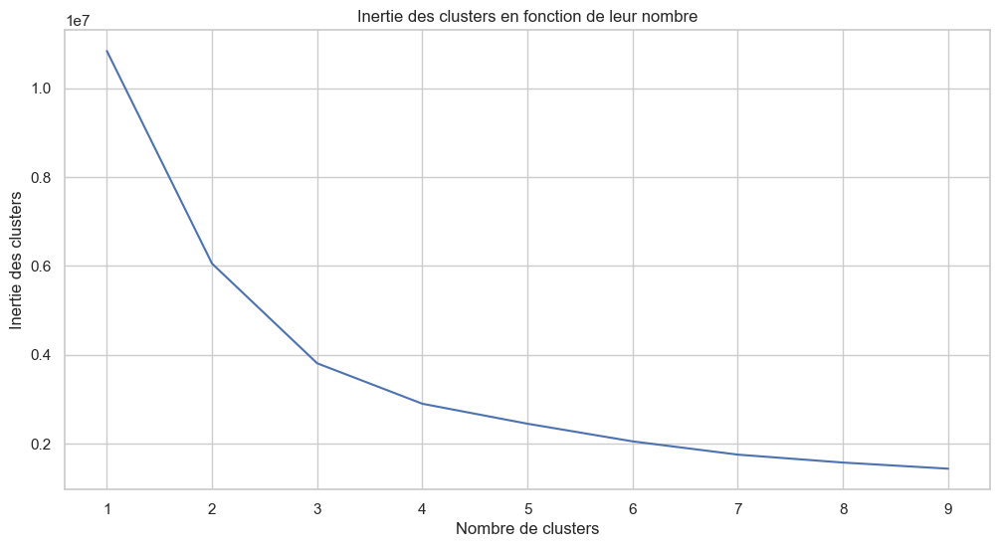

In [171]:
# Affichage des différentes inertie à la recherche d'un "coude" pour déterminer le nombre de clusters idéal
fig, ax = plt.subplots(1,1,figsize=(12,6))

ax.set_ylabel("intertia")
ax.set_xlabel("n_cluster")
ax = plt.plot(k_list, intertia)
plt.title("Inertie des clusters en fonction de leur nombre")
plt.xlabel("Nombre de clusters")
plt.ylabel("Inertie des clusters")

In [172]:
# tests avec 3 clusters
kmeans = KMeans(n_clusters=3, n_init=10)
kmeans.fit(X_scaled)

KMeans(n_clusters=3, n_init=10)

In [173]:
# Changement de nom des clusters et intégraption dans les données 
dd = {i:j for i, j in enumerate(list("abc"))}
labels = [dd[i] for i in kmeans.labels_]
nutriments_with_energy_data["cluster"] = labels
nutriments_with_energy_data

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,cluster
0,1941.0,160.740,2.220446e-16,17.860,17.860,0.635000,17.86,7.10,0.0,a
1,2540.0,514.260,5.360000e+00,57.140,3.570,1.224280,17.86,7.10,0.0,a
2,1552.0,12.870,5.440000e-01,1.430,59.200,40.320401,8.57,5.70,0.0,b
3,1933.0,164.430,1.920000e+00,18.270,11.540,22.929682,13.46,7.70,0.0,a
4,1490.0,214.902,3.222000e+00,23.878,25.554,0.579120,8.89,7.78,0.0,a
...,...,...,...,...,...,...,...,...,...,...
253942,1643.0,25.200,6.000000e-01,2.800,2.600,0.680000,13.00,5.90,0.0,a
253943,2406.0,181.800,3.730000e+00,20.200,3.890,0.100000,21.22,12.20,0.0,a
253944,21.0,1.800,2.000000e-01,0.200,0.500,0.025400,0.50,0.20,0.0,a
253945,0.0,0.000,2.220446e-16,0.000,0.000,0.000000,0.00,0.00,0.0,a


In [174]:
# Récupération des différents centroïds
centroids = pd.DataFrame(robust_scaler_cluster.inverse_transform(
    kmeans.cluster_centers_),
                         columns=nutriments_with_energy_columns, index=["a", "b", "c"])
centroids

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g
a,1129.168620,127.398236,4.611455,14.155360,17.321696,1.219875,7.102653,3.021679,3.039892e-02
b,467.013104,46.133614,1.667719,5.125957,19.834301,62.061865,2.568850,1.945681,1.110223e-16
c,423.193112,21.549168,0.686354,2.394352,12.519796,0.437776,1.926615,1.548665,5.172862e+01


<Figure size 1500x600 with 0 Axes>

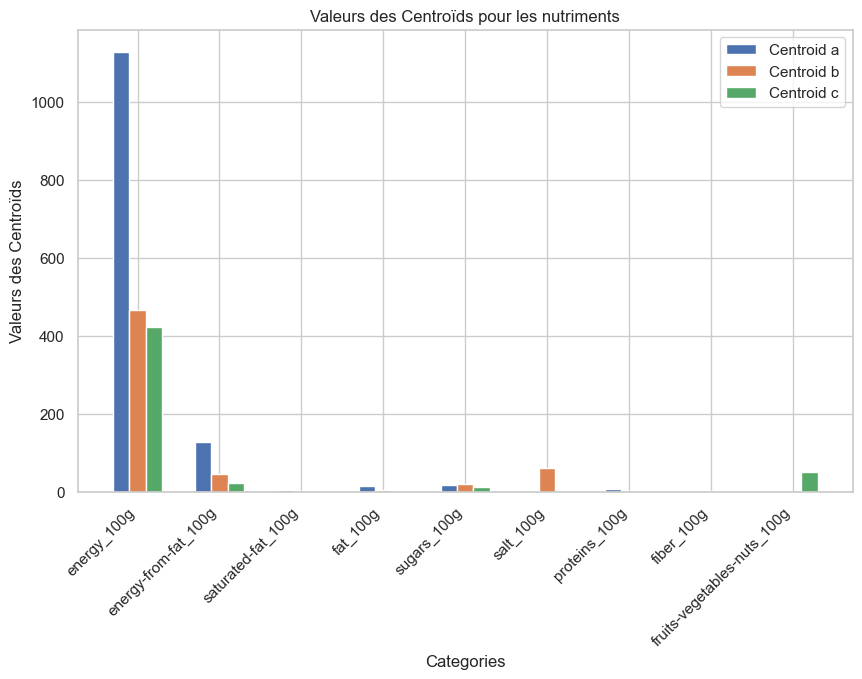

In [175]:
# Créer une figure avec une largeur de 15 et une hauteur de 6 pouces
plt.figure(figsize=(15, 6))

categories = list(centroids.keys())
num_categories = len(categories)
num_centroids = len(centroids[categories[0]])

# Créer une plage pour les positions des barres
bar_positions = np.arange(num_categories)

# Largeur des barres
bar_width = 0.2

# Créer une figure
plt.figure(figsize=(10, 6))

# Créer les graphiques de barres pour chaque centroïde
for i in range(num_centroids):
    centroid_values = [centroids[cat][i] for cat in categories]
    plt.bar(bar_positions + i * bar_width, centroid_values, width=bar_width, label=f"Centroid {centroids.index[i]}")

# Étiqueter les axes et ajouter une légende et un titre
plt.xlabel("Categories")
plt.ylabel("Valeurs des Centroïds")
plt.xticks(bar_positions + bar_width * (num_centroids - 1) / 2, categories, rotation=45, ha="right")
plt.legend()
plt.title("Valeurs des Centroïds pour les nutriments")

# Afficher le graphique
plt.show()

In [176]:
# Tests avec 4 clusters
kmeans = KMeans(n_clusters=4, n_init=10)
kmeans.fit(X_scaled)

KMeans(n_clusters=4, n_init=10)

In [177]:
# Changement de nom des clusters
dd = {i:j for i, j in enumerate(list("abcd"))}
labels = [dd[i] for i in kmeans.labels_]
nutriments_with_energy_data["cluster"] = labels
nutriments_with_energy_data

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g,cluster
0,1941.0,160.740,2.220446e-16,17.860,17.860,0.635000,17.86,7.10,0.0,b
1,2540.0,514.260,5.360000e+00,57.140,3.570,1.224280,17.86,7.10,0.0,b
2,1552.0,12.870,5.440000e-01,1.430,59.200,40.320401,8.57,5.70,0.0,d
3,1933.0,164.430,1.920000e+00,18.270,11.540,22.929682,13.46,7.70,0.0,d
4,1490.0,214.902,3.222000e+00,23.878,25.554,0.579120,8.89,7.78,0.0,b
...,...,...,...,...,...,...,...,...,...,...
253942,1643.0,25.200,6.000000e-01,2.800,2.600,0.680000,13.00,5.90,0.0,b
253943,2406.0,181.800,3.730000e+00,20.200,3.890,0.100000,21.22,12.20,0.0,b
253944,21.0,1.800,2.000000e-01,0.200,0.500,0.025400,0.50,0.20,0.0,b
253945,0.0,0.000,2.220446e-16,0.000,0.000,0.000000,0.00,0.00,0.0,b


In [178]:
# Récupération des centroïds
centroids = pd.DataFrame(robust_scaler_cluster.inverse_transform(
    kmeans.cluster_centers_),
                         columns=nutriments_with_energy_columns, index=["a", "b", "c", "d"])
centroids

,energy_100g,energy-from-fat_100g,saturated-fat_100g,fat_100g,sugars_100g,salt_100g,proteins_100g,fiber_100g,fruits-vegetables-nuts_100g
a,332.121061,36.325084,1.402910,4.036120,17.624644,75.152558,1.794753,1.150530,-1.082467e-15
b,1131.789768,128.274907,4.650210,14.252767,17.160209,0.954014,7.108928,3.000437,3.083481e-02
c,423.193112,21.549168,0.686354,2.394352,12.519796,0.437776,1.926615,1.548665,5.172862e+01
d,896.741094,65.547394,1.948960,7.283044,27.594482,23.747509,6.115651,4.263344,-2.220446e-16


<Figure size 1500x600 with 0 Axes>

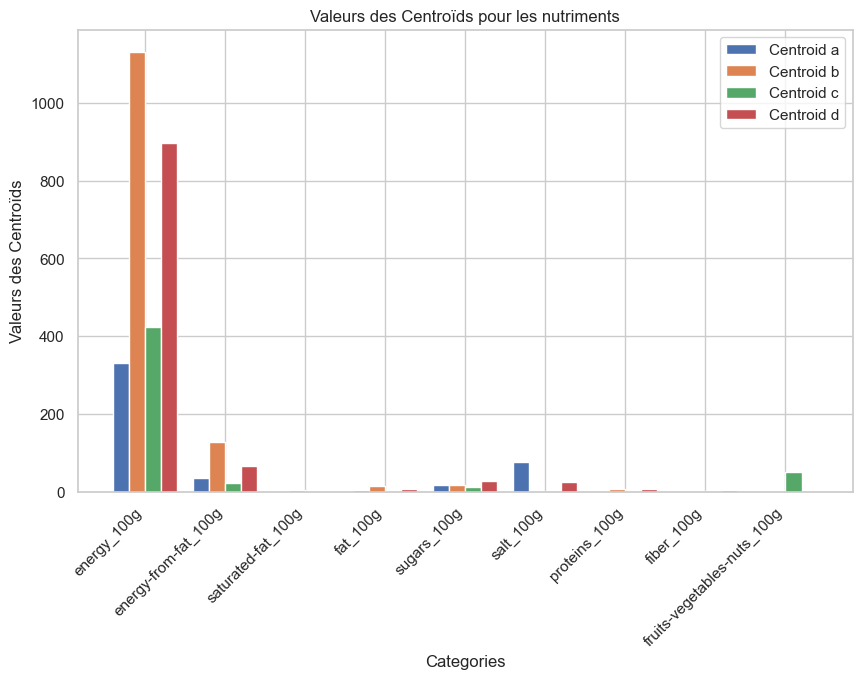

In [179]:
# Créer une figure avec une largeur de 15 et une hauteur de 6 pouces
plt.figure(figsize=(15, 6))

categories = list(centroids.keys())
num_categories = len(categories)
num_centroids = len(centroids[categories[0]])

# Créer une plage pour les positions des barres
bar_positions = np.arange(num_categories)

# Largeur des barres
bar_width = 0.2

# Créer une figure
plt.figure(figsize=(10, 6))

# Créer les graphiques de barres pour chaque centroïde
for i in range(num_centroids):
    centroid_values = [centroids[cat][i] for cat in categories]
    plt.bar(bar_positions + i * bar_width, centroid_values, width=bar_width, label=f"Centroid {centroids.index[i]}")

# Étiqueter les axes et ajouter une légende et un titre
plt.xlabel("Categories")
plt.ylabel("Valeurs des Centroïds")
plt.xticks(bar_positions + bar_width * (num_centroids - 1) / 2, categories, rotation=45, ha="right")
plt.legend()
plt.title("Valeurs des Centroïds pour les nutriments")

# Afficher le graphique
plt.show()

# ANOVA

In [181]:
# Création des tests ANOVA comparant les valeurs que prennent chaque variable
# En comparant avec les Nutriscores
graph_data = []
for col in nutriments_with_energy_columns:
    # Récupération des données
    group_data = [
        transformed_data[transformed_data["nutrition_grade_fr"] ==
                         nutriscore][col]
        for nutriscore in transformed_data["nutrition_grade_fr"].unique()
    ]

    # Calcul des variances et pourcentages
    f_statistique, p_value = f_oneway(*group_data)
    
    # Ajout es valeurs de variance à la liste
    graph_data.append(f_statistique)

    # Affichage des résultats
    print(f"Résultat ANOVA : {col}")
    print("Statistique F :", f_statistique)
    print("Valeur de p :", p_value, "\n")

Résultat ANOVA : energy_100g
Statistique F : 37613.71492064734
Valeur de p : 0.0 

Résultat ANOVA : energy-from-fat_100g
Statistique F : 14132.551877918831
Valeur de p : 0.0 

Résultat ANOVA : saturated-fat_100g
Statistique F : 22373.717965240183
Valeur de p : 0.0 

Résultat ANOVA : fat_100g
Statistique F : 14132.551877918837
Valeur de p : 0.0 

Résultat ANOVA : sugars_100g
Statistique F : 21628.054459136805
Valeur de p : 0.0 

Résultat ANOVA : salt_100g
Statistique F : 3968.360501400409
Valeur de p : 0.0 

Résultat ANOVA : proteins_100g
Statistique F : 2423.231986217799
Valeur de p : 0.0 

Résultat ANOVA : fiber_100g
Statistique F : 5122.616415051449
Valeur de p : 0.0 

Résultat ANOVA : fruits-vegetables-nuts_100g
Statistique F : 223.42536366738761
Valeur de p : 8.423530971314699e-192 



Text(0.5, 1.0, 'Représentation des variances en fonction des nutriments')

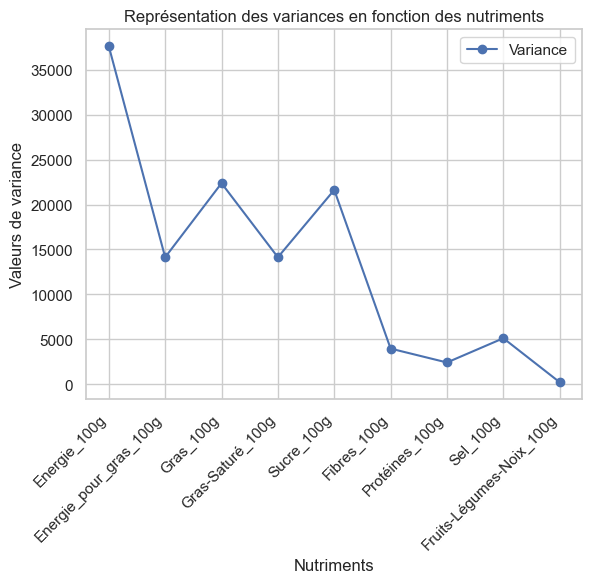

In [182]:
# Affichage des variances par variable
plt.plot(graph_data, marker="o")
plt.xticks([0,1,2,3,4,5,6,7,8], ["Energie_100g",
    "Energie_pour_gras_100g", "Gras_100g", "Gras-Saturé_100g", "Sucre_100g",
    "Fibres_100g", "Protéines_100g", "Sel_100g", "Fruits-Légumes-Noix_100g",], rotation=45, ha="right")
plt.legend(["Variance"])
plt.xlabel("Nutriments")
plt.ylabel("Valeurs de variance")
plt.title("Représentation des variances en fonction des nutriments")

# Test Statistique

In [183]:
# Création des deux DataFrame à comparer
energy_data = transformed_data["energy_100g"]
fat_data = transformed_data["fat_100g"]

# Calcul de la corrélation de Pearson (Relation linéaire)
pearson_corr, pearson_p_value = stats.pearsonr(energy_data, fat_data)

# Calcul de la corrélation de Spearman
spearman_corr, spearman_p_value = stats.spearmanr(energy_data, fat_data)

print("Corrélation de Pearson :", pearson_corr)
print("Valeur de p (Pearson) :", pearson_p_value)
print()
print("Corrélation de Spearman :", spearman_corr)
print("Valeur de p (Spearman) :", spearman_p_value)

Corrélation de Pearson : 0.7062110154224686
Valeur de p (Pearson) : 0.0

Corrélation de Spearman : 0.683234630975271
Valeur de p (Spearman) : 0.0
